# **Trabalho \#2**:  Aprendizado de Máquina e Reconhecimento de Padrões MC886/MO444
Instituto de Computação (IC/UNICAMP), 2ᵒ Semestre, 2024

Profa. Sandra Avila, 2024s2

Trabalho proposto por Caio Petrucci Rosa (PAD), Cesar Guedes Carneiro (PED) e Sandra Avila.



In [1403]:
# TODO: RA & Nome
print('RA 217787: ' + 'Bruno Sobreira França')
print('RA 169374: ' + 'Daniel Paulo Garcia')

RA 217787: Bruno Sobreira França
RA 169374: Daniel Paulo Garcia


## Objetivo

Explore os modelos de **regressão linear** e **regressão logística** e apresente o melhor modelo que você encontrar para o problema, evitando o *overfitting*. Em particular, realize predições acerca do salário dos profissionais da área de dados no Brasil, com base nos dados da pesquisa State of Data Brazil 2023, levando em consideração variáveis como perfil demográfico, formação, experiência e atuação no setor.


---

## Base de Dados

A base de dados deste trabalho foi criado a partir de dados disponibilizados em [State of Data Brazil 2023](https://www.kaggle.com/datasets/datahackers/state-of-data-brazil-2023). Os dados refletem a pesquisa realizada com profissionais da área de Ciência de Dados no Brasil. As respostas foram coletadas em 2023 e a base de dados contém uma ampla variedade de perguntas sobre o perfil demográfico, situação profissional e conhecimentos técnicos dessas pessoas.

**Dicionário de dados:**

* **id**: Identificador único da pessoa participante;

* **idade**: Idade da pessoa participante;

* **genero**: Gênero da pessoa participante;

* **cor_raca**: Cor/raça/etnia da pessoa participante;

* **pcd**: Se a pessoa participante possui alguma deficiência (PCD);

* **estado_residencia**: Estado onde a pessoa participante mora;

* **mudou_estado**: Se a pessoa participante mudou de estado recentemente;

* **regiao_origem**: Região de origem da pessoa participante;

* **nivel_ensino**: Nível de ensino da pessoa participante;

* **area_formacao**: Área de formação acadêmica;

* **situacao_trabalho**: Situação atual de trabalho;

* **setor**: Setor em que a pessoa participante trabalha;

* **numero_funcionarios**: Número de funcionários na empresa onde a pessoa participante trabalha;

* **gestor**: Se a pessoa participante é gestor na empresa;

* **cargo**: Cargo da pessoa participante;

* **nivel_profissional**: Nível profissional da pessoa participante;

* **tempo_exp_dados**: Tempo de experiência na área de dados;

* **tempo_exp_ti**: Tempo de experiência prévia na área de TI ou Engenharia de Software antes de atuar com dados;

* **satisfacao_empresa**: Nível de satisfação da pessoa participante com sua empresa atual;

* **forma_trabalho_atual**: Forma de trabalho atual (presencial, remoto, híbrido);

* **atuacao_dia_a_dia**: Reflexão da atuação da pessoa participante no dia a dia em relação ao cargo formal;

* **fontes_dados_analise**: Fontes de dados já analisadas ou processadas pela pessoa participante no trabalho;

* **fontes_dados_uso**: Fontes de dados mais utilizadas pela pessoa participante no trabalho;

* **linguagens_trabalho**: Linguagens de programação utilizadas no trabalho;

* **linguagem_mais_usada**: Linguagem de programação mais utilizada no trabalho;

* **linguagem_preferida**: Linguagem de programação preferida da pessoa participante;

* **bancos_dados_trabalho**: Bancos de dados utilizados no trabalho;

* **cloud_preferida**: Cloud preferida da pessoa participante;

* **cloud_usada**: Cloud usada no trabalho;

* **ferramenta_bi_dia_a_dia**: Ferramenta de BI utilizada no dia a dia;

* **ferramenta_bi_preferida**: Ferramenta de BI preferida;

* **tipo_uso_ai**: Tipo de uso de AI Generativa e LLMs na empresa;

* **uso_chatgpt**: Se a pessoa participante utiliza ChatGPT ou LLMs no trabalho;

* **faixa_salarial**: Faixa salarial da pessoa participante;

* **salario**: Valor do salário da pessoa participante.


Você deve **respeitar a seguinte divisão de treino/teste**:

    train_data.csv
    test_data.csv

Lembre-se de criar **seu próprio conjunto de validação**, a partir um subconjunto do conjunto de treinamento, e utilize o conjunto de teste (a ser disponibilizado) apenas para inferência e relato do resultado final.

### Atividades

1. (0,4 pontos) Realize a limpeza e preparação dos dados de treinamento.

  > **Considere os seguintes fatores:**
  > - Existem outliers nos dados? Se sim, como você pretende tratá-los (removê-los, ajustá-los, ou usar uma abordagem alternativa)?
  > - Há valores ausentes? Se sim, como irá lidar com eles? (Ex.: exclusão de linhas, preenchimento por média/mediana/moda, ou outros métodos).
  > - Como você planeja tratar variáveis categóricas? (Ex.: one-hot encoding, label encoding, ou outra estratégia).

In [1404]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
%matplotlib inline

In [1405]:
# Lê o dataset e configura o pandas para exibir todos os dados
train = pd.read_csv("train_data.csv")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [1406]:
# Apresenta os dados para ter uma ideia de como as colunas se comportam
train.head(3)

,id,idade,genero,cor_raca,pcd,estado_residencia,mudou_estado,regiao_origem,nivel_ensino,area_formacao,situacao_trabalho,setor,numero_funcionarios,gestor,nivel_profissional,tempo_exp_dados,tempo_exp_ti,satisfacao_empresa,forma_trabalho_atual,atuacao_dia_a_dia,fontes_dados_analise,fontes_dados_uso,linguagens_trabalho,linguagem_mais_usada,linguagem_preferida,bancos_dados_trabalho,cloud_preferida,cloud_usada,ferramenta_bi_dia_a_dia,ferramenta_bi_preferida,tipo_uso_ai,uso_chatgpt,cargo,faixa_salarial,salario
0,rpck9xz6tncfzyjdm0xbrpck9qsla13r,29,Masculino,Branca,Não,Minas Gerais (MG),1.0,NaN,Mestrado,Computação / Engenharia de Software / Sistemas...,Empreendedor ou Empregado (CNPJ),Tecnologia/Fábrica de Software,de 11 a 50,1.0,NaN,de 7 a 10 anos,de 1 a 2 anos,1.0,Modelo híbrido flexível (o funcionário tem lib...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Sócio ou C-level (CEO, CDO, CIO, CTO etc)",de R$ 25.001/mês a R$ 30.000/mês,27510.0
1,zyg9519671iqrgy93qzyg95183k8ix5f,34,Masculino,Preta,Não,Minas Gerais (MG),1.0,NaN,Pós-graduação,Computação / Engenharia de Software / Sistemas...,Empreendedor ou Empregado (CNPJ),Tecnologia/Fábrica de Software,de 501 a 1.000,1.0,NaN,de 7 a 10 anos,Mais de 10 anos,1.0,Modelo 100% remoto,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Team Leader/Tech Leader,de R$ 20.001/mês a R$ 25.000/mês,23837.0
2,gavi59777z42jezo6gavi5myj0c932sd,28,Feminino,Branca,Não,Distrito Federal (DF),1.0,NaN,Doutorado ou Phd,Computação / Engenharia de Software / Sistemas...,Empregado (CLT),Outra Opção,Acima de 3.000,1.0,NaN,de 4 a 6 anos,Menos de 1 ano,1.0,Modelo 100% remoto,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Gerente/Head,de R$ 20.001/mês a R$ 25.000/mês,21406.0


In [1407]:
'''
  Descreve o dados númericos através de suas estatisticas

  Observações:
    - Média de idade das pessoas é de 31 anos
    - O salário tem um outlier claro que é a pessoa que recebe 1 real
    - O salário tem um desvio padrão muito alto, algo esperado dado
      o grande intervalo de valores que essa coluna tem
    - A pessoas parecem mais satisfeitas com seu trabalho
'''
train.describe()

,idade,mudou_estado,gestor,satisfacao_empresa,salario
count,3802.000000,3719.000000,3802.000000,3802.000000,3802.000000
mean,31.842451,0.794300,0.189111,0.720410,10813.185166
std,7.272583,0.404267,0.391648,0.448857,10216.885675
min,18.000000,0.000000,0.000000,0.000000,1.000000
25%,27.000000,1.000000,0.000000,0.000000,4833.000000
50%,30.000000,1.000000,0.000000,1.000000,8351.500000
75%,36.000000,1.000000,0.000000,1.000000,13695.500000
max,70.000000,1.000000,1.000000,1.000000,98017.000000


In [1408]:
'''
  Essa celular nos diz quantos dados o dataset tem, um total 3802 pessoas, e
  quantos valore são preenchidos por coluna, informação necessário para a posterior
  fase de preenchimento dos dados faltantes.

  Observaçõa:
    - A coluna região de origem tem menos da metade dos dados preenchida, logo será
    excluída no futuro
'''
train.count()

,0
id,3802
idade,3802
genero,3802
cor_raca,3802
pcd,3802
estado_residencia,3719
mudou_estado,3719
regiao_origem,765
nivel_ensino,3802
area_formacao,3722


In [1409]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3802 entries, 0 to 3801
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       3802 non-null   object 
 1   idade                    3802 non-null   int64  
 2   genero                   3802 non-null   object 
 3   cor_raca                 3802 non-null   object 
 4   pcd                      3802 non-null   object 
 5   estado_residencia        3719 non-null   object 
 6   mudou_estado             3719 non-null   float64
 7   regiao_origem            765 non-null    object 
 8   nivel_ensino             3802 non-null   object 
 9   area_formacao            3722 non-null   object 
 10  situacao_trabalho        3802 non-null   object 
 11  setor                    3802 non-null   object 
 12  numero_funcionarios      3802 non-null   object 
 13  gestor                   3802 non-null   float64
 14  nivel_profissional      

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


([0, 1, 2, 3, 4, 5, 6, 7],
 [Text(0, 0, 'de 7 a 10 anos'),
  Text(1, 0, 'de 4 a 6 anos'),
  Text(2, 0, 'de 1 a 2 anos'),
  Text(3, 0, 'Mais de 10 anos'),
  Text(4, 0, 'de 3 a 4 anos'),
  Text(5, 0, 'Menos de 1 ano'),
  Text(6, 0, 'de 5 a 6 anos'),
  Text(7, 0, 'Não tenho experiência na área de dados')])

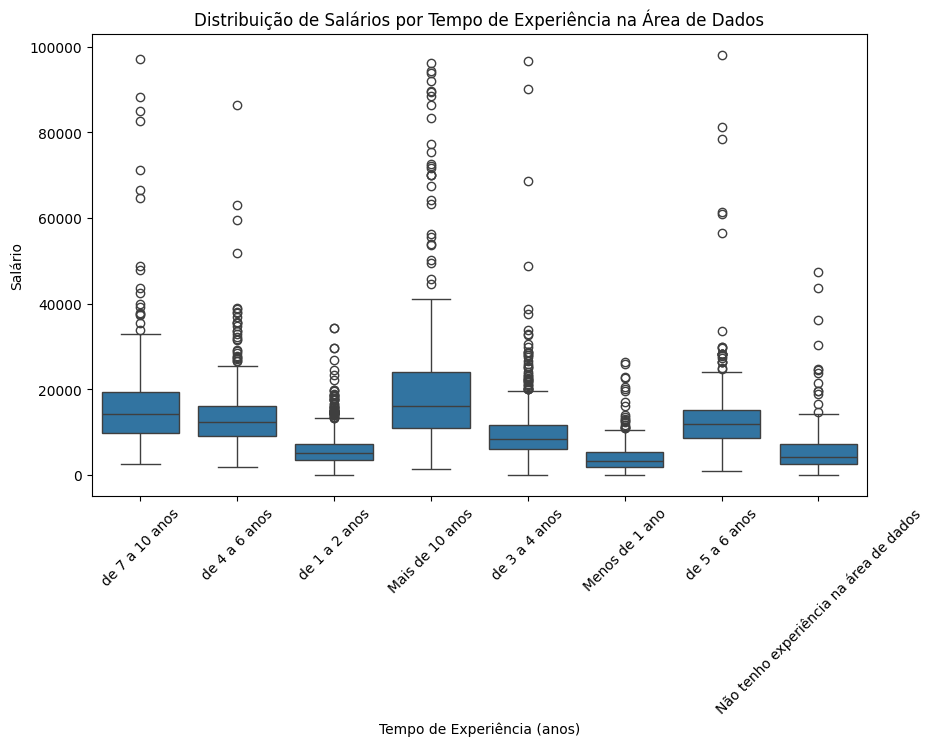

In [1410]:
'''
  Acreditamos que uma boa forma de identificar outliers é plotando o boxplot por
  experiência na área de dados. O nosso viés é que exista uma certa margem de ganhos
  conforme o tempo de experiência na área de dados aumenta, identificar outlier de
  acodo com o tempo parace mais adequado do que apenas olhar o salário de uma meneira
  geral.
'''

plt.figure(figsize=(10, 6))

sns.boxplot(x='tempo_exp_dados', y='salario', data=train)

plt.title('Distribuição de Salários por Tempo de Experiência na Área de Dados')
plt.xlabel('Tempo de Experiência (anos)')
plt.ylabel('Salário')

plt.xticks(rotation=45)


In [1411]:
'''
  Estamos removendo os outliers utilizando a técnica de intervalo interquartílico (IQR).
  O IQR é uma medida de dispersão que se baseia nos quartis Q1 (25º percentil) e Q3 (75º percentil) dos dados.
  A diferença entre Q3 e Q1 define o intervalo que contém os 50% centrais dos dados.
  Qualquer valor que caia fora de uma faixa calculada como Q1 - 1.5*IQR (limite inferior) ou Q3 + 1.5*IQR (limite superior)
  é considerado um outlier, ou seja, um valor que se desvia significativamente da maioria dos dados.
'''

def adjust_dataset_exludes_outliers(train):
  def detect_outliers(group):
      Q1 = np.percentile(group['salario'], 25)
      Q3 = np.percentile(group['salario'], 90)
      IQR = Q3 - Q1
      lower_bound = Q1 - 1.5 * IQR
      upper_bound = Q3 + 1.5 * IQR
      return group[(group['salario'] < lower_bound) | (group['salario'] > upper_bound)]

  # Agrupar por experiência na área de dado e checa os outliers
  outliers_per_experience = train.groupby('tempo_exp_dados').apply(detect_outliers)

  # Cerca de 200 dados foram excluídos através desta técnica
  train = train[~train['id'].isin(outliers_per_experience['id'])]

  # Remove pessoas que ganhão abaixo de 300 reais
  train = train[300 < train['salario']]

  # Existe apenas uma pessoa com a classificação a seguir
  return train[train['faixa_salarial'] != "de R$ 101/mês a R$ 2.000/mês"]

train = adjust_dataset_exludes_outliers(train)
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3734 entries, 0 to 3801
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       3734 non-null   object 
 1   idade                    3734 non-null   int64  
 2   genero                   3734 non-null   object 
 3   cor_raca                 3734 non-null   object 
 4   pcd                      3734 non-null   object 
 5   estado_residencia        3658 non-null   object 
 6   mudou_estado             3658 non-null   float64
 7   regiao_origem            751 non-null    object 
 8   nivel_ensino             3734 non-null   object 
 9   area_formacao            3658 non-null   object 
 10  situacao_trabalho        3734 non-null   object 
 11  setor                    3734 non-null   object 
 12  numero_funcionarios      3734 non-null   object 
 13  gestor                   3734 non-null   float64
 14  nivel_profissional       3045

<ipython-input-1411-42b27562945e>:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  outliers_per_experience = train.groupby('tempo_exp_dados').apply(detect_outliers)


In [1412]:
'''
  Nos não iremos usar as seguintes features nos nossos modelos.

  Principais motivos:
    - Acreditarmos não fazer sentido para a tarefa proposta
    - Existem muitos dados faltantes
'''

def adjust_dataset_drop_unecessary_features(train):
  dropped_features = [
      # A feature regiao_origem acreditamos ser relevante, porem
      # ela tem menos de 800 dados validos
      'regiao_origem',
      # As feaures a seguir acreditamos que não são relevantes para
      # o modelo
      'id',
      'numero_funcionarios',
      'satisfacao_empresa',
      'fontes_dados_analise',
      'fontes_dados_uso',
      'linguagem_mais_usada',
      'linguagem_preferida',
      'cloud_usada',
      'cloud_preferida',
      'ferramenta_bi_preferida',
      'uso_chatgpt',
      'bancos_dados_trabalho',
      'tipo_uso_ai',
      'estado_residencia',
      'linguagens_trabalho',
      'ferramenta_bi_dia_a_dia',
      'mudou_estado',
      'atuacao_dia_a_dia',
      'forma_trabalho_atual',
      'genero',
      'cor_raca',
      'pcd'
  ]


  return train.drop(dropped_features, axis=1)

data_selected_features = adjust_dataset_drop_unecessary_features(train)
data_selected_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3734 entries, 0 to 3801
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   idade               3734 non-null   int64  
 1   nivel_ensino        3734 non-null   object 
 2   area_formacao       3658 non-null   object 
 3   situacao_trabalho   3734 non-null   object 
 4   setor               3734 non-null   object 
 5   gestor              3734 non-null   float64
 6   nivel_profissional  3045 non-null   object 
 7   tempo_exp_dados     3734 non-null   object 
 8   tempo_exp_ti        3734 non-null   object 
 9   cargo               3734 non-null   object 
 10  faixa_salarial      3734 non-null   object 
 11  salario             3734 non-null   float64
dtypes: float64(2), int64(1), object(9)
memory usage: 379.2+ KB


In [1413]:
'''
  Tratamento de dados faltantes com preenchimento de valores de acordo com
  sua distribuição.
'''

def adjust_dataset_fill_empty_data(dataset):
  def fill_na_with_distribution(df, column):
      value_counts = df[column].value_counts(normalize=True)

      missing = df[column].isnull()
      df.loc[missing, column] = np.random.choice(
          value_counts.index,
          size=missing.sum(),
          p=value_counts.values
      )

  # Colunas para preencher com base na distribuição
  # Observe que apenas será preenchido colunas anteriormente selecionadas
  features_to_fill = [
      'area_formacao',
      'nivel_profissional',
#      'linguagens_trabalho',
 #     'ferramenta_bi_dia_a_dia',
  ]

  # Aplicar a função para preencher cada coluna com base na distribuição
  for feature in features_to_fill:
      fill_na_with_distribution(dataset, feature)
  return dataset

data_selected_features = adjust_dataset_fill_empty_data(data_selected_features)
print(data_selected_features.info())


<class 'pandas.core.frame.DataFrame'>
Index: 3734 entries, 0 to 3801
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   idade               3734 non-null   int64  
 1   nivel_ensino        3734 non-null   object 
 2   area_formacao       3734 non-null   object 
 3   situacao_trabalho   3734 non-null   object 
 4   setor               3734 non-null   object 
 5   gestor              3734 non-null   float64
 6   nivel_profissional  3734 non-null   object 
 7   tempo_exp_dados     3734 non-null   object 
 8   tempo_exp_ti        3734 non-null   object 
 9   cargo               3734 non-null   object 
 10  faixa_salarial      3734 non-null   object 
 11  salario             3734 non-null   float64
dtypes: float64(2), int64(1), object(9)
memory usage: 379.2+ KB
None


In [1414]:
'''
  Nesto trecho é feito a codificação ordinal de variáveis categóricas em um DataFrame.
  A codificação ordinal atribui valores numéricos a categorias de acordo com uma ordem específica.
  Para isso, o código define um dicionário (`features_to_ordinal_encode`) onde as chaves são os nomes das variáveis
  categóricas e os valores são listas que contêm a ordem das categorias.
'''


def adjust_dataset_encode_order(dataset):
  features_to_ordinal_encode = {
      'tempo_exp_dados': [
          'Não tenho experiência na área de dados',
          'Menos de 1 ano',
          'de 1 a 2 anos',
          'de 3 a 4 anos',
          'de 4 a 6 anos',
          'de 5 a 6 anos',
          'de 7 a 10 anos',
          'Mais de 10 anos'
          ],
      'tempo_exp_ti': [
          'Não tive experiência na área de TI/Engenharia de Software antes de começar a trabalhar na área de dados',
          'Menos de 1 ano',
          'de 1 a 2 anos',
          'de 3 a 4 anos',
          'de 5 a 6 anos',
          'de 7 a 10 anos',
          'Mais de 10 anos',
      ],
      'nivel_ensino': [
          'Prefiro não informar',
          'Não tenho graduação formal',
          'Estudante de Graduação',
          'Graduação/Bachareladoo',
          'Pós-graduação',
          'Mestrado',
          'Doutorado ou Phd'
          ],
      'nivel_profissional': [
          'Júnior',
          'Pleno',
          'Sênior',
          'Estagiário'
          ],
  }

  def encode_order(data, feature, order):
    data[feature] = pd.Categorical(data[feature], categories=order, ordered=True)
    data[feature] = data[feature].cat.codes

  for feature, order in features_to_ordinal_encode.items():
    encode_order(dataset, feature, order)
  return dataset
data_selected_features = adjust_dataset_encode_order(data_selected_features)
data_selected_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3734 entries, 0 to 3801
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   idade               3734 non-null   int64  
 1   nivel_ensino        3734 non-null   int8   
 2   area_formacao       3734 non-null   object 
 3   situacao_trabalho   3734 non-null   object 
 4   setor               3734 non-null   object 
 5   gestor              3734 non-null   float64
 6   nivel_profissional  3734 non-null   int8   
 7   tempo_exp_dados     3734 non-null   int8   
 8   tempo_exp_ti        3734 non-null   int8   
 9   cargo               3734 non-null   object 
 10  faixa_salarial      3734 non-null   object 
 11  salario             3734 non-null   float64
dtypes: float64(2), int64(1), int8(4), object(5)
memory usage: 277.1+ KB


In [1415]:
'''
  Esta função aplica One-Hot Encoding nas variáveis categóricas que não possuem uma relação ordinal.
  Ela substitui as colunas originais pelas novas colunas codificadas.
'''

def adjust_dataset_one_hot_encoding(dataset):
  def apply_one_hot_encoding(data, columns_to_encode):
      for feature in columns_to_encode:
          data = pd.concat([data,
                            pd.get_dummies(data[feature], prefix=feature).groupby(level=0).sum()],
                          axis=1)
          data.drop(feature, axis=1, inplace=True)
      return data

  # Lista das colunas categóricas sem relação ordinal
  features_to_one_hot_encode = [
      'area_formacao',
      'situacao_trabalho',
      'setor',
      'cargo',
  ]

  # Aplica a função de One-Hot Encoding ao DataFrame
  return apply_one_hot_encoding(dataset, features_to_one_hot_encode)

data_selected_features = adjust_dataset_one_hot_encoding(data_selected_features)
data_selected_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3734 entries, 0 to 3801
Data columns (total 68 columns):
 #   Column                                                                                Non-Null Count  Dtype  
---  ------                                                                                --------------  -----  
 0   idade                                                                                 3734 non-null   int64  
 1   nivel_ensino                                                                          3734 non-null   int8   
 2   gestor                                                                                3734 non-null   float64
 3   nivel_profissional                                                                    3734 non-null   int8   
 4   tempo_exp_dados                                                                       3734 non-null   int8   
 5   tempo_exp_ti                                                                          37

In [1416]:
def adjust_dataset_encode_multilabel(dataset):
  feature_multivalued_columns = [
    #'linguagens_trabalho',
    #'ferramenta_bi_dia_a_dia',
  ]

  for feature in feature_multivalued_columns:
    dataset[feature] = dataset[feature].str.split(', ')

    dataset = pd.concat([dataset,
                pd.get_dummies(dataset[feature].apply(pd.Series).stack(), prefix=feature).groupby(level=0).sum()],
              axis=1)

    dataset.drop(feature, axis=1, inplace=True)
  return dataset

data_selected_features = adjust_dataset_encode_multilabel(data_selected_features)
data_selected_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3734 entries, 0 to 3801
Data columns (total 68 columns):
 #   Column                                                                                Non-Null Count  Dtype  
---  ------                                                                                --------------  -----  
 0   idade                                                                                 3734 non-null   int64  
 1   nivel_ensino                                                                          3734 non-null   int8   
 2   gestor                                                                                3734 non-null   float64
 3   nivel_profissional                                                                    3734 non-null   int8   
 4   tempo_exp_dados                                                                       3734 non-null   int8   
 5   tempo_exp_ti                                                                          37

In [1417]:
'''
  Normalizamos todos os dados númericos para que eles fiquem na mesma escala de 0 a 1.
'''

def adjust_dataset_normalize(dataset):
  def normalize(data, feature):
    data[feature] = (data[feature] - data[feature].min()) / (data[feature].max() - data[feature].min())


  for feature in dataset.columns:
    if not 'salari' in feature:
      normalize(dataset, feature)

  return dataset

data_selected_features = adjust_dataset_normalize(data_selected_features)

In [1418]:
'''
  Este é o nosso conjunto de dados pronto para os treinos com as features que
  achamos interessantes para a tarefa proposta
'''
data_selected_features.head(3)

,idade,nivel_ensino,gestor,nivel_profissional,tempo_exp_dados,tempo_exp_ti,faixa_salarial,salario,area_formacao_Ciências Biológicas/ Farmácia/ Medicina/ Área da Saúde,area_formacao_Ciências Sociais,area_formacao_Computação / Engenharia de Software / Sistemas de Informação/ TI,area_formacao_Economia/ Administração / Contabilidade / Finanças/ Negócios,area_formacao_Estatística/ Matemática / Matemática Computacional/ Ciências Atuariais,area_formacao_Marketing / Publicidade / Comunicação / Jornalismo,area_formacao_Outra opção,area_formacao_Outras Engenharias,area_formacao_Química / Física,situacao_trabalho_Empreendedor ou Empregado (CNPJ),situacao_trabalho_Empregado (CLT),situacao_trabalho_Estagiário,situacao_trabalho_Freelancer,situacao_trabalho_Prefiro não informar,situacao_trabalho_Servidor Público,situacao_trabalho_Vivo fora do Brasil e trabalho para empresa de fora do Brasil,situacao_trabalho_Vivo no Brasil e trabalho remoto para empresa de fora do Brasil,setor_Agronegócios,setor_Educação,setor_Entretenimento ou Esportes,setor_Filantropia/ONG's,setor_Finanças ou Bancos,setor_Indústria,setor_Internet/Ecommerce,setor_Marketing,setor_Outra Opção,setor_Seguros ou Previdência,setor_Setor Alimentício,setor_Setor Automotivo,setor_Setor Farmaceutico,setor_Setor Imobiliário/ Construção Civil,setor_Setor Público,setor_Setor de Energia,setor_Tecnologia/Fábrica de Software,setor_Telecomunicação,setor_Varejo,setor_Área da Saúde,setor_Área de Consultoria,cargo_Analista de BI/BI Analyst,cargo_Analista de Dados/Data Analyst,cargo_Analista de Inteligência de Mercado/Market Intelligence,cargo_Analista de Negócios/Business Analyst,cargo_Analista de Suporte/Analista Técnico,cargo_Analytics Engineer,cargo_Cientista de Dados/Data Scientist,cargo_DBA/Administrador de Banco de Dados,cargo_Data Product Manager/ Product Manager (PM/APM/DPM/GPM/PO),cargo_Desenvolvedor/ Engenheiro de Software/ Analista de Sistemas,cargo_Diretor/VP,cargo_Economista,cargo_Engenheiro de Dados/Arquiteto de Dados/Data Engineer/Data Architect,cargo_Engenheiro de Machine Learning/ML Engineer/AI Engineer,cargo_Estatístico,cargo_Gerente/Head,cargo_Outra Opção,cargo_Outras Engenharias (não inclui dev),cargo_Professor/Pesquisador,cargo_Supervisor/Coordenador,"cargo_Sócio ou C-level (CEO, CDO, CIO, CTO etc)",cargo_Team Leader/Tech Leader
0,0.211538,0.857143,1.0,0.0,0.857143,0.333333,de R$ 25.001/mês a R$ 30.000/mês,27510.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.307692,0.714286,1.0,0.5,0.857143,1.000000,de R$ 20.001/mês a R$ 25.000/mês,23837.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.192308,1.000000,1.0,1.0,0.571429,0.166667,de R$ 20.001/mês a R$ 25.000/mês,21406.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


2. (0,5 pontos) Faça uma análise exploratória de dados.

  > Procure entender como os dados se comportam e as relações entre diferentes *features*.
  >
  > **Alguns fatores a serem considerados:** Quais as distribuição dos valores de cada atributos? Como é a correlação entre os diferentes atributos? Existe multicolinearidade entre algumas *features*?

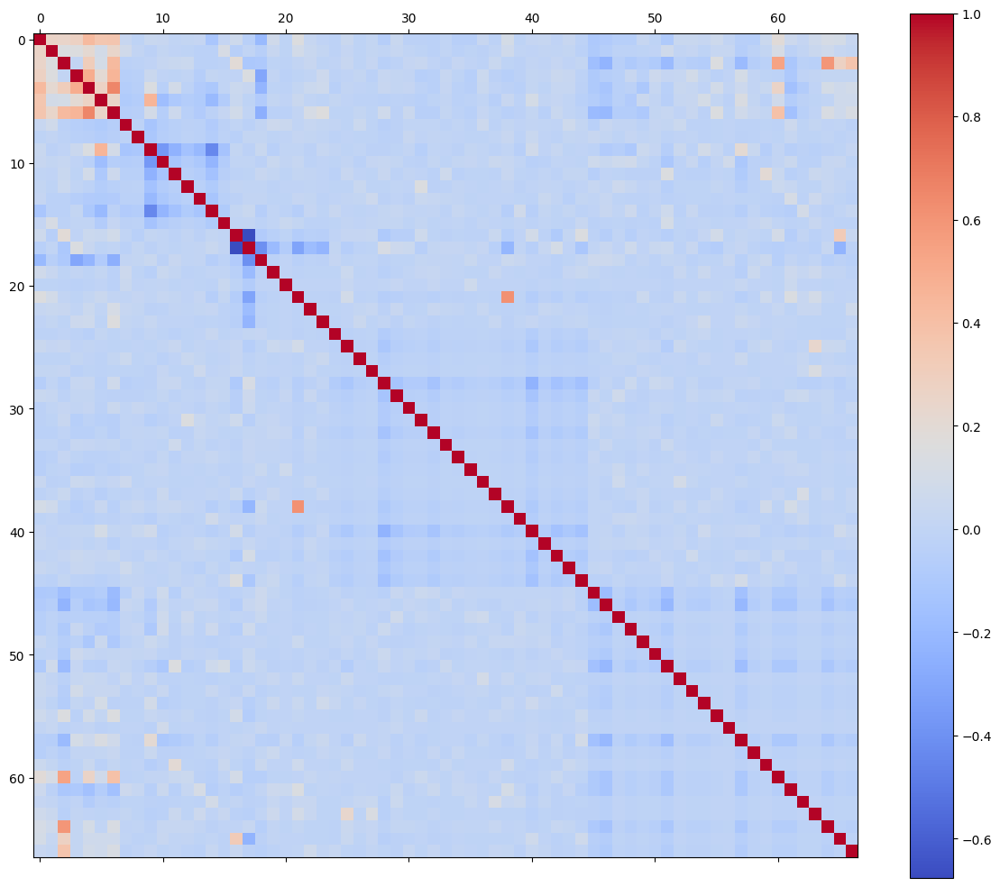

In [1339]:
'''
  Essa célula plot a matriz de correlação
'''

plt.figure(figsize=(12, 10))
corr_matrix = data_selected_features.drop('faixa_salarial', axis=1).corr()
plt.matshow(corr_matrix, fignum=0, cmap='coolwarm')
plt.colorbar()
plt.tight_layout()
plt.show()

In [1430]:
'''
  Na matriz de correlação acima existe algumas features que aparentem ter uma grande
  correlação. Essa celula expande esse subconjunto de features para a enxergar melhor
'''

from statsmodels.stats.outliers_influence import variance_inflation_factor

subset_fetures = data_selected_features[data_selected_features.columns[:8]]

subset_fetures = subset_fetures.drop('salario', axis=1)
columns = subset_fetures.columns.drop(['faixa_salarial'])
values = subset_fetures[columns].values
vif_data = pd.DataFrame()
vif_data["feature"] = columns
vif_data["VIF"] = [variance_inflation_factor(values, i) for i in range(len(columns))]
print(vif_data)


              feature       VIF
0               idade  5.245295
1        nivel_ensino  2.704280
2              gestor  1.410086
3  nivel_profissional  3.890217
4     tempo_exp_dados  5.817843
5        tempo_exp_ti  1.961096


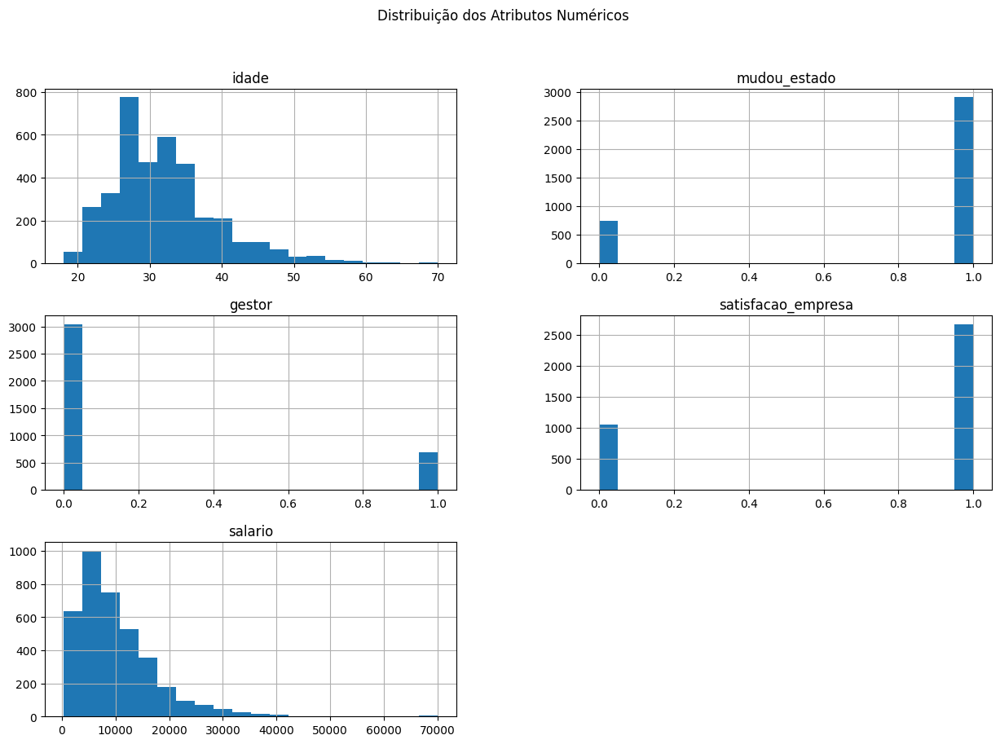

In [1087]:
'''
  Essa célula plota alguns histogramas para que possamos entender melhor a distribuição
  dos dados.
'''
numeric_columns = train.select_dtypes(include=['float64', 'int64']).columns
train[numeric_columns].hist(bins=20, figsize=(15, 10))
plt.suptitle('Distribuição dos Atributos Numéricos')
plt.show()


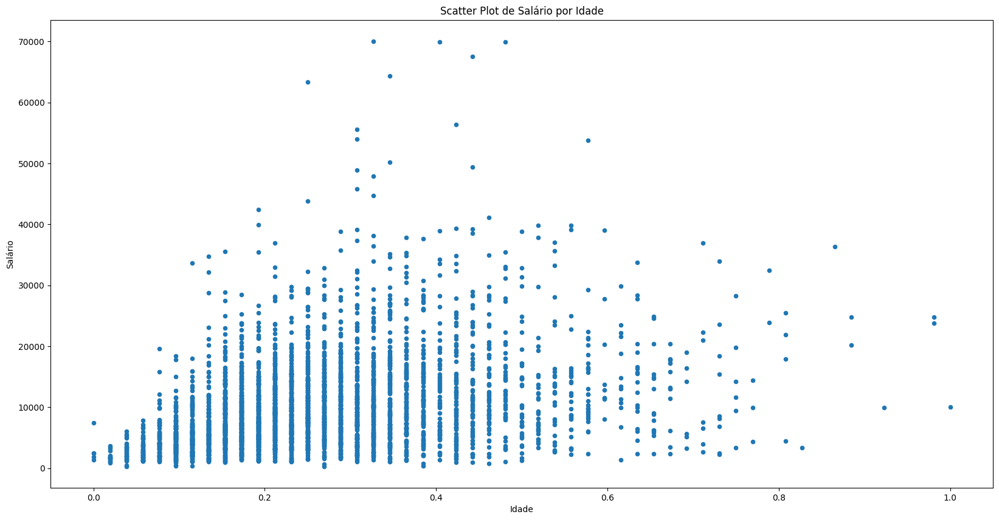

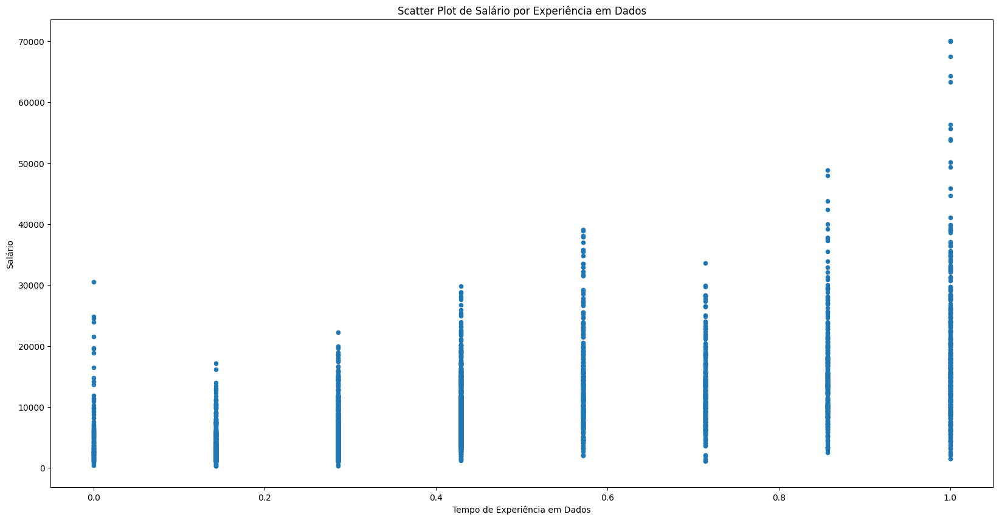

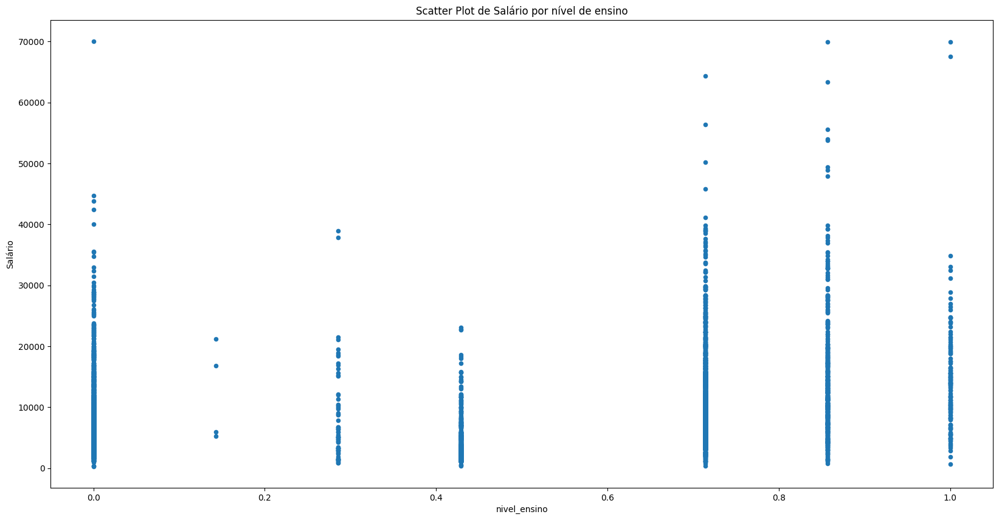

In [1088]:
'''
  Plotamos algumas informações, para fazer uma análise exploratória dos dados e
  enteder como eles se comportam.
'''

data_selected_features.plot(kind='scatter', x='idade', y='salario', figsize=(20, 10))
plt.xlabel('Idade')
plt.ylabel('Salário')
plt.title('Scatter Plot de Salário por Idade')
plt.show()


data_selected_features.plot(kind='scatter', x='tempo_exp_dados', y='salario', figsize=(20, 10))
plt.xlabel('Tempo de Experiência em Dados')
plt.title('Scatter Plot de Salário por Experiência em Dados')
plt.ylabel('Salário')
plt.show()

data_selected_features.plot(kind='scatter', x='nivel_ensino', y='salario', figsize=(20, 10))
plt.xlabel('nivel_ensino')
plt.ylabel('Salário')
plt.title('Scatter Plot de Salário por nível de ensino')
plt.show()


In [1089]:
'''
  Quais serão as linguagens mais utilizadas?
'''
train['linguagens_trabalho'].str.split(', ').explode().value_counts()

train['ferramenta_bi_dia_a_dia'].str.split(', ').explode().value_counts()

,count
ferramenta_bi_dia_a_dia,
Microsoft PowerBI,1700
Tableau,566
Looker Studio (antigo Google Data Studio),513
Looker,352
Não utilizo nenhuma ferramenta de BI no trabalho,320
Fazemos todas as análises utilizando apenas Excel ou planilhas do google,302
Metabase,262
Grafana,216
Qlik View/Qlik Sense,160


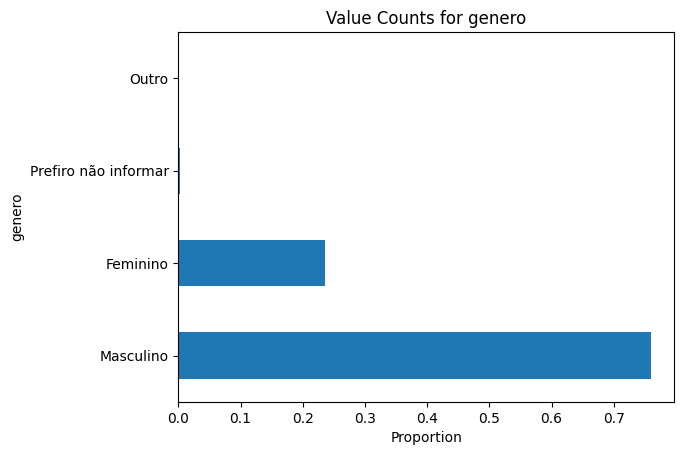

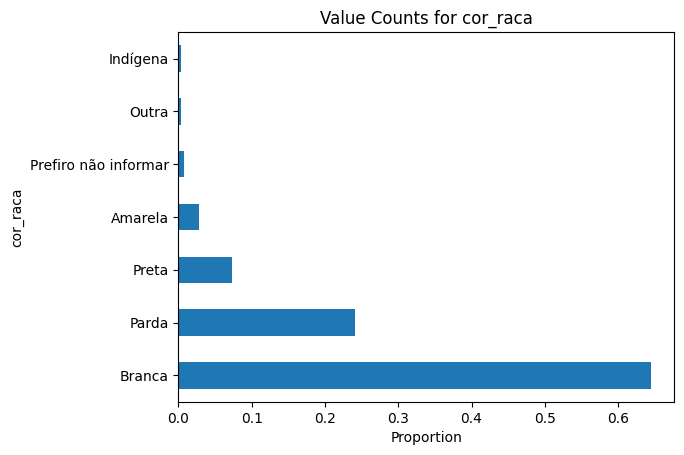

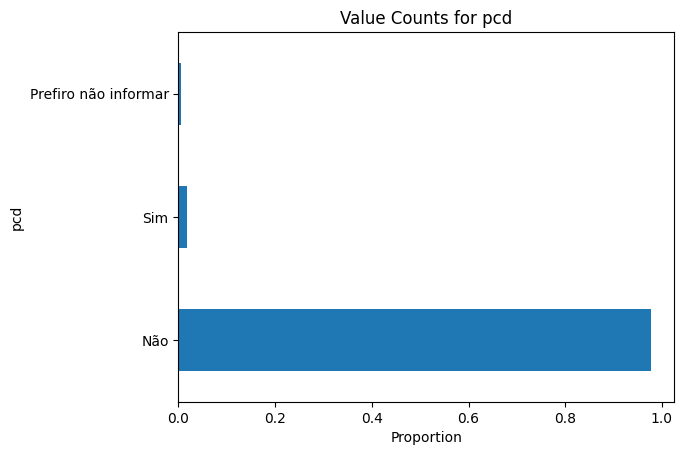

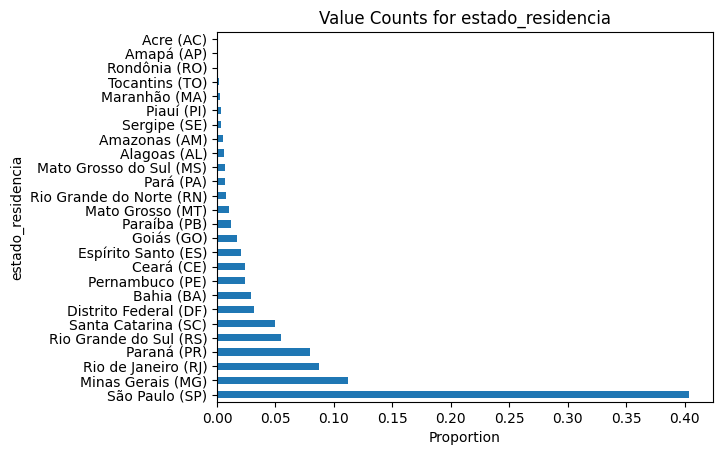

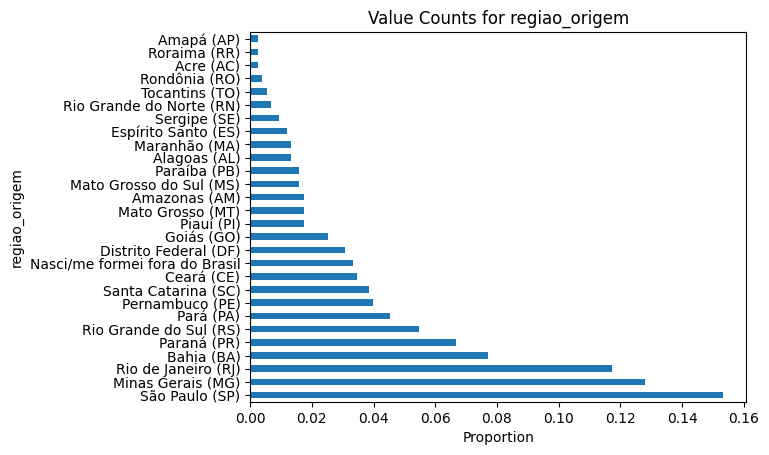

...

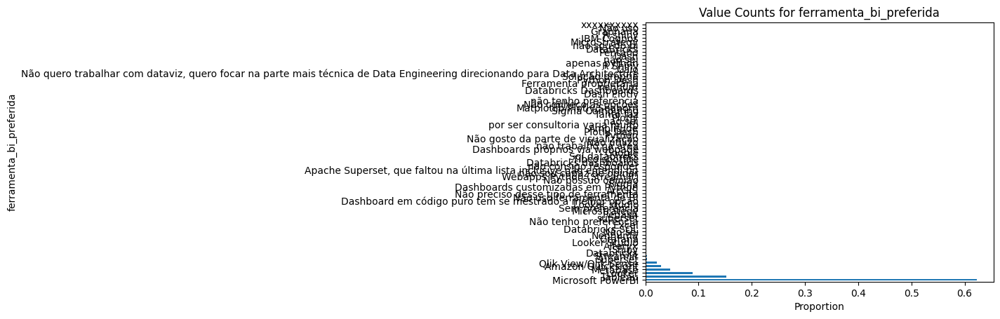

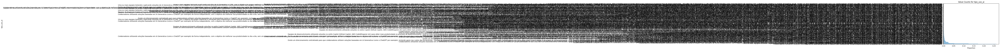

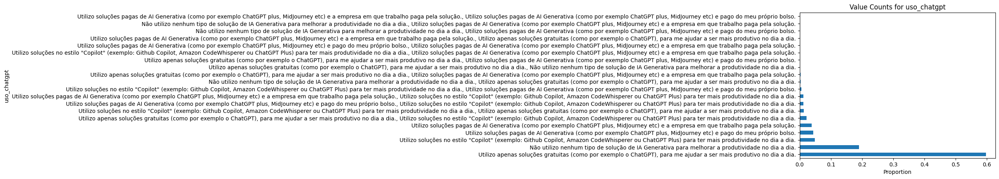

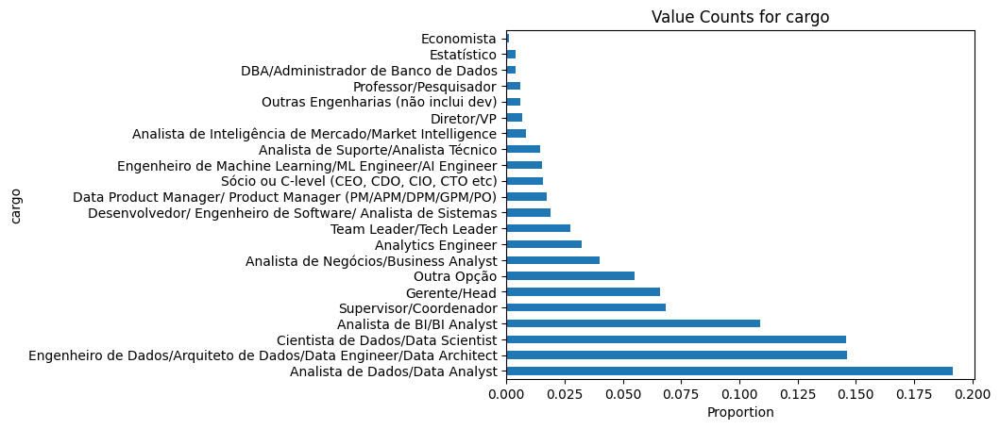

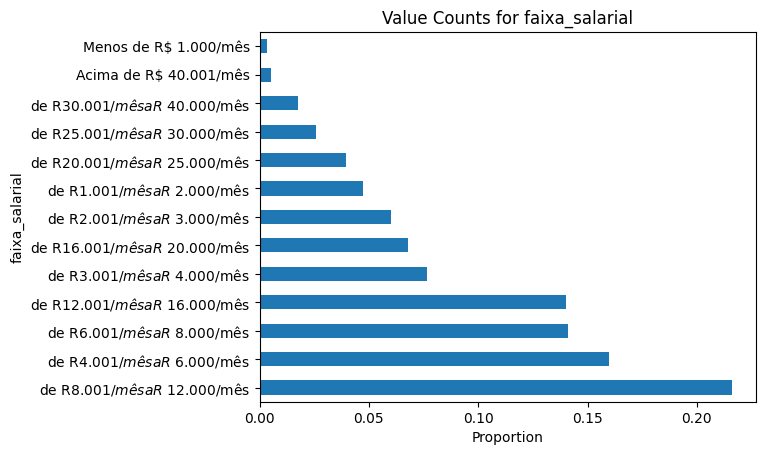

In [1090]:
'''
  Estamos realizando uma análise adicional plotando gráficos de barras horizontais para as colunas categóricas.
  Esses gráficos ajudam a visualizar a distribuição relativa das diferentes categorias em cada variável.
'''

object_columns = train.select_dtypes(include=['object']).columns
for i in object_columns:
  if i != 'id':
    train[i].value_counts(normalize=True).plot(kind='barh')
    plt.title(f'Value Counts for {i}')
    plt.xlabel('Proportion')
    plt.ylabel(i)
    plt.show()


3. (0,1 pontos) Divida o seu conjunto de treinamento em dois conjuntos: treinamento e validação. A proporção de divisão pode ser escolhida, mas pense no impacto que isso pode resultar em seu modelo.

  > **Dica:** Defina uma *seed* para seus resultados serem reprodutíveis.

In [1419]:
'''
  Essa célula serve para separar o dataset entre treino e validação. Criamos
  conjuntos separados para regressão e para classificação.
'''

X = data_selected_features.drop([i for i in data_selected_features.columns if 'salari' in i] , axis=1)
y = data_selected_features['salario']
y_class = data_selected_features['faixa_salarial']

# Divide o dataset entre 80% treino e 20% validação
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_class, X_val_class, y_train_class, y_val_class = train_test_split(X, y_class, test_size=0.2)


In [1446]:
print(X_train[''].value_counts())
print(y_val_class.value_counts())

faixa_salarial
de R$ 8.001/mês a R$ 12.000/mês     659
de R$ 4.001/mês a R$ 6.000/mês      464
de R$ 6.001/mês a R$ 8.000/mês      434
de R$ 12.001/mês a R$ 16.000/mês    409
de R$ 3.001/mês a R$ 4.000/mês      234
de R$ 16.001/mês a R$ 20.000/mês    203
de R$ 2.001/mês a R$ 3.000/mês      176
de R$ 1.001/mês a R$ 2.000/mês      140
de R$ 20.001/mês a R$ 25.000/mês    115
de R$ 25.001/mês a R$ 30.000/mês     75
de R$ 30.001/mês a R$ 40.000/mês     50
Acima de R$ 40.001/mês               17
Menos de R$ 1.000/mês                11
Name: count, dtype: int64
faixa_salarial
de R$ 8.001/mês a R$ 12.000/mês     148
de R$ 4.001/mês a R$ 6.000/mês      133
de R$ 12.001/mês a R$ 16.000/mês    115
de R$ 6.001/mês a R$ 8.000/mês       92
de R$ 3.001/mês a R$ 4.000/mês       52
de R$ 16.001/mês a R$ 20.000/mês     50
de R$ 2.001/mês a R$ 3.000/mês       49
de R$ 1.001/mês a R$ 2.000/mês       36
de R$ 20.001/mês a R$ 25.000/mês     33
de R$ 25.001/mês a R$ 30.000/mês     21
de R$ 30.001/mês a R$ 40

## Regressão Linear

Esta parte do trabalho visa prever o valor do salário dos profissionais, descrita pelo atributo `salario`, com base em seus dados demográficos e informações de carreira.

O atributo alvo nesta etapa é o atributo `salario`. Portanto, não utilize os atributos `salario` e `faixa_salarial` como *features* dos seus modelos, apenas para o cálculo da função de custo durante o treinamento e a validação.

### Atividades

1. (0,1 pontos) Faça a seleção das features mais importantes para o treinamento da sua regressão linear, com base em sua análise exploratória.

In [1093]:
'''
  As features já foram selecionados anteriormente na fase de preparação dos dados.
  Portanto X_train já contém as features que achamos interessantes para o problema.
'''
X_train.head(3)

,idade,nivel_ensino,gestor,nivel_profissional,tempo_exp_dados,tempo_exp_ti,genero_Feminino,genero_Masculino,genero_Outro,genero_Prefiro não informar,cor_raca_Amarela,cor_raca_Branca,cor_raca_Indígena,cor_raca_Outra,cor_raca_Parda,cor_raca_Prefiro não informar,cor_raca_Preta,pcd_Não,pcd_Prefiro não informar,pcd_Sim,area_formacao_Ciências Biológicas/ Farmácia/ Medicina/ Área da Saúde,area_formacao_Ciências Sociais,area_formacao_Computação / Engenharia de Software / Sistemas de Informação/ TI,area_formacao_Economia/ Administração / Contabilidade / Finanças/ Negócios,area_formacao_Estatística/ Matemática / Matemática Computacional/ Ciências Atuariais,area_formacao_Marketing / Publicidade / Comunicação / Jornalismo,area_formacao_Outra opção,area_formacao_Outras Engenharias,area_formacao_Química / Física,situacao_trabalho_Empreendedor ou Empregado (CNPJ),situacao_trabalho_Empregado (CLT),situacao_trabalho_Estagiário,situacao_trabalho_Freelancer,situacao_trabalho_Prefiro não informar,situacao_trabalho_Servidor Público,situacao_trabalho_Vivo fora do Brasil e trabalho para empresa de fora do Brasil,situacao_trabalho_Vivo no Brasil e trabalho remoto para empresa de fora do Brasil,setor_Agronegócios,setor_Educação,setor_Entretenimento ou Esportes,setor_Filantropia/ONG's,setor_Finanças ou Bancos,setor_Indústria,setor_Internet/Ecommerce,setor_Marketing,setor_Outra Opção,setor_Seguros ou Previdência,setor_Setor Alimentício,setor_Setor Automotivo,setor_Setor Farmaceutico,setor_Setor Imobiliário/ Construção Civil,setor_Setor Público,setor_Setor de Energia,setor_Tecnologia/Fábrica de Software,setor_Telecomunicação,setor_Varejo,setor_Área da Saúde,setor_Área de Consultoria,cargo_Analista de BI/BI Analyst,cargo_Analista de Dados/Data Analyst,cargo_Analista de Inteligência de Mercado/Market Intelligence,cargo_Analista de Negócios/Business Analyst,cargo_Analista de Suporte/Analista Técnico,cargo_Analytics Engineer,cargo_Cientista de Dados/Data Scientist,cargo_DBA/Administrador de Banco de Dados,cargo_Data Product Manager/ Product Manager (PM/APM/DPM/GPM/PO),cargo_Desenvolvedor/ Engenheiro de Software/ Analista de Sistemas,cargo_Diretor/VP,cargo_Economista,cargo_Engenheiro de Dados/Arquiteto de Dados/Data Engineer/Data Architect,cargo_Engenheiro de Machine Learning/ML Engineer/AI Engineer,cargo_Estatístico,cargo_Gerente/Head,cargo_Outra Opção,cargo_Outras Engenharias (não inclui dev),cargo_Professor/Pesquisador,cargo_Supervisor/Coordenador,"cargo_Sócio ou C-level (CEO, CDO, CIO, CTO etc)",cargo_Team Leader/Tech Leader,linguagens_trabalho_.NET,linguagens_trabalho_C/C++/C#,linguagens_trabalho_Java,linguagens_trabalho_JavaScript,linguagens_trabalho_Julia,linguagens_trabalho_Matlab,linguagens_trabalho_Não utilizo nenhuma das linguagens listadas,linguagens_trabalho_PHP,linguagens_trabalho_Python,linguagens_trabalho_R,linguagens_trabalho_Rust,linguagens_trabalho_SAS/Stata,linguagens_trabalho_SQL,linguagens_trabalho_Scala,linguagens_trabalho_Visual Basic/VBA,ferramenta_bi_dia_a_dia_Alteryx,ferramenta_bi_dia_a_dia_Amazon Quicksight,ferramenta_bi_dia_a_dia_Birst,ferramenta_bi_dia_a_dia_Fazemos todas as análises utilizando apenas Excel ou planilhas do google,ferramenta_bi_dia_a_dia_Grafana,ferramenta_bi_dia_a_dia_IBM Analytics/Cognos,ferramenta_bi_dia_a_dia_Looker,ferramenta_bi_dia_a_dia_Looker Studio (antigo Google Data Studio),ferramenta_bi_dia_a_dia_Metabase,ferramenta_bi_dia_a_dia_MicroStrategy,ferramenta_bi_dia_a_dia_Microsoft PowerBI,ferramenta_bi_dia_a_dia_Mode,ferramenta_bi_dia_a_dia_Não utilizo nenhuma ferramenta de BI no trabalho,ferramenta_bi_dia_a_dia_Oracle Business Intelligence,ferramenta_bi_dia_a_dia_Outra opção,ferramenta_bi_dia_a_dia_Pentaho,ferramenta_bi_dia_a_dia_Qlik View/Qlik Sense,ferramenta_bi_dia_a_dia_Redash,ferramenta_bi_dia_a_dia_SAP Business Objects/SAP Analytics,ferramenta_bi_dia_a_dia_SAS Visual Analytics,ferramenta_bi_dia_a_dia_Salesforce/Einstein Analytics,ferramenta_bi_dia_a_dia_Superset,ferramenta_bi_dia_a_dia_TIBCO Spotfire

2. (1,75 pontos) Implemente e execute a regressão linear.

  Faça uma classe `LinearRegression` capaz de encontrar uma regressão utilizando dois métodos: **descida do gradiente** e a **equação normal**.

  Para a otimização por **descida do gradiente**, guarde o histórico da função de custo por época e retorno este histórico após a execução do ajuste. Além disso, utilize uma learning rate de `0.01` nesta etapa.

  > **Observações:** Inicie randomicamente sua regressão linear e lembre-se de não utilizar dados de teste no treinamento.

  Lembre-se que:

  > A hipótese da regressão linear é: $ h_\theta(x) = \theta^Tx$.
  >
  > E, o objetivo da regressão linear é minimizar a função de custo Root Mean Squared Error (RMSE):
  >
  > $$ J(\theta) = \frac{1}{2m} \sum_{i=1}^m (h_\theta(x^{(i)}) - y^{(i)})^2 $$
  >
  > Para minimizar o custo $J(\theta)$, o algoritmo de descida do gradiente realiza uma atualização nos parâmetros do modelo a cada iteração:
  >
  > $$\theta_j := \theta_j - \alpha \frac{\partial}{\partial\theta_j}J(\theta) = \theta_j - \alpha \frac{1}{m} \sum_{i=1}^m (h_\theta(x^{(i)}) - y^{(i)})x_j^{(i)} $$
  >
  > onde $j$ é o índice do parâmetro a ser atualizado (atualizando simultaneamente $\theta_j$ para todos os $j$) e $\alpha$ é a taxa de aprendizado.

In [1094]:
class LinearModel:
      def loss_function(self, y_true, y_pred):
        mse = np.mean((y_pred - y_true) ** 2) # Mean Squared Error
        return np.sqrt(mse)  # Return RMSE


class GradientDescentModel(LinearModel):
    def __init__(self, learning_rate=0.0008, epochs=30000):
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.theta = None
        self.history_train = []
        self.history_val = []

    def fit(self, x_train, y_train, x_val=None, y_val=None):
        m, n = x_train.shape
        self.theta = np.random.rand(n) + 0.1 # Inicializa de maneira aletória
        y_predict = np.array([np.mean(y_train)] * m) # Iniciliaza com média

        for _ in range(self.epochs):
            for i in range(n):
                gradient = (1 / m) * np.sum((y_predict - y_train) * x_train[:, i])
                self.theta[i] -= self.learning_rate * gradient

            # Previsões atualizadas
            y_predict = np.dot(x_train, self.theta)

            self.history_train.append(self.loss_function(y_train, y_predict))
            if x_val is not None and y_val is not None:
              self.history_val.append(self.loss_function(y_val, self.predict(x_val)))

    def predict(self, x):
        return np.dot(x, self.theta)


    def plot_loss(self):
        plt.figure(figsize=(10, 6))
        plt.plot(self.history_train, label='Loss (Training)', color='blue')
        plt.plot(self.history_val, label='Loss (Validation)', color='orange')
        plt.title('Função de Custo vs. Número de Épocas')
        plt.xlabel('Épocas')
        plt.ylabel('Função de Custo (Loss)')
        plt.legend()
        plt.grid()
        plt.show()

class LinearRegressionModel(LinearModel):
    def __init__(self):
        self.theta = None

    def fit(self, X, y):
        X_transpose = np.transpose(X)  # Transpõe a matriz de entrada
        X_transpose_X = np.dot(X_transpose, X)  # Calcula X^T * X
        X_transpose_y = np.dot(X_transpose, y)  # Calcula X^T * y
        self.theta = np.linalg.solve(X_transpose_X, X_transpose_y)

    def predict(self, X):
        return np.dot(X, self.theta)

In [1345]:
gd = GradientDescentModel(learning_rate=0.0008, epochs=2000)
gd.fit(X_train.values, y_train.values)

lr = LinearRegressionModel()
lr.fit(X_train.values, y_train.values)

lr_loss = lr.loss_function(y_val.values, lr.predict(X_val.values))
gd_loss = gd.loss_function(y_val.values, gd.predict(X_val.values))

print(f'Loss LinearRegression: {lr_loss}')
print(f'Loss GradientDescent: {gd_loss}')

Loss LinearRegression: 4097.822392790542
Loss GradientDescent: 4992.285513718481


> **Quais foram suas conclusões? (1-2 parágrafos)**




*Escreva as conclusões aqui.*

In [1096]:
'''
  O modelo não apresentou um bom desempenho, uma vez que a perda (loss) do modelo baseado em descida do gradiente no conjunto de validação foi de mais de 3000.
  Isso indica que o modelo não consegue prever de forma eficaz o salário de uma pessoa.

  Acreditamos que essa  performance pode ser consequência do conjunto de features selecionadaos o do falta de complexidade do modelo.
'''


'\n  O modelo não apresentou um bom desempenho, uma vez que a perda (loss) do modelo baseado em descida do gradiente no conjunto de validação foi de mais de 3000.\n  Isso indica que o modelo não consegue prever de forma eficaz o salário de uma pessoa.\n\n  Acreditamos que essa  performance pode ser consequência do conjunto de features selecionadaos o do falta de complexidade do modelo.\n'

3. (0,75 pontos) Experimente diferentes valores de *learning rates* para a descida de gradiente (GD). Plote o histórico da função de custo (função de custo vs. número de épocas) no conjunto de treinamento e no de validação para cada experimento.



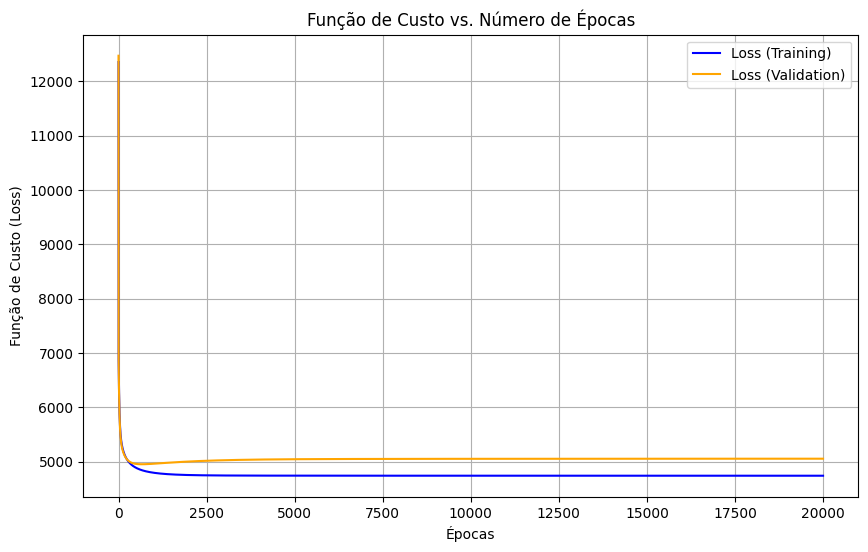

In [1097]:
gd = GradientDescentModel(learning_rate=0.1, epochs=20000)
gd.fit(X_train.values, y_train.values, X_val.values, y_val.values)
gd.plot_loss()

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-1094-cb158112a64e>:3: RuntimeWarning: overflow encountered in square
  mse = np.mean((y_pred - y_true) ** 2) # Mean Squared Error
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
<ipython-input-1094-cb158112a64e>:22: RuntimeWarning: invalid value encountered in multiply
  gradient = (1 / m) * np.sum((y_predict - y_train) * x_train[:, i])


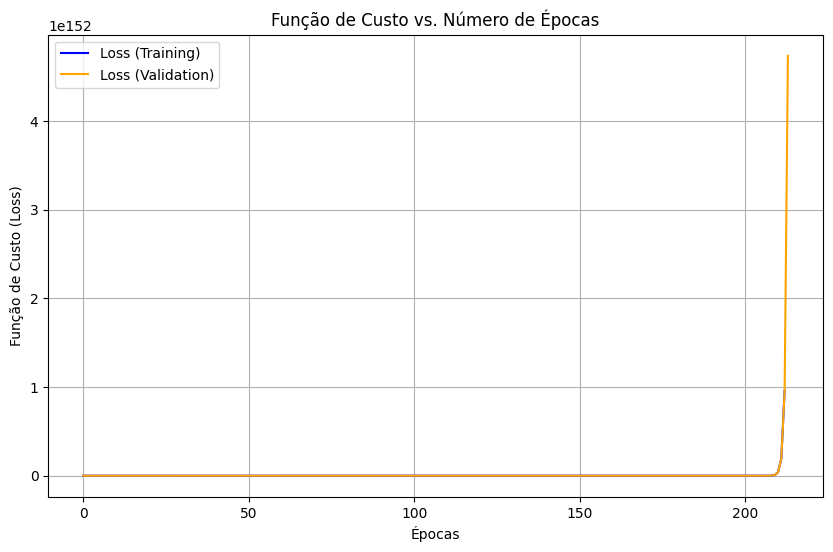

In [1098]:
gd = GradientDescentModel(learning_rate=1, epochs=2000)
gd.fit(X_train.values, y_train.values, X_val.values, y_val.values)
gd.plot_loss()

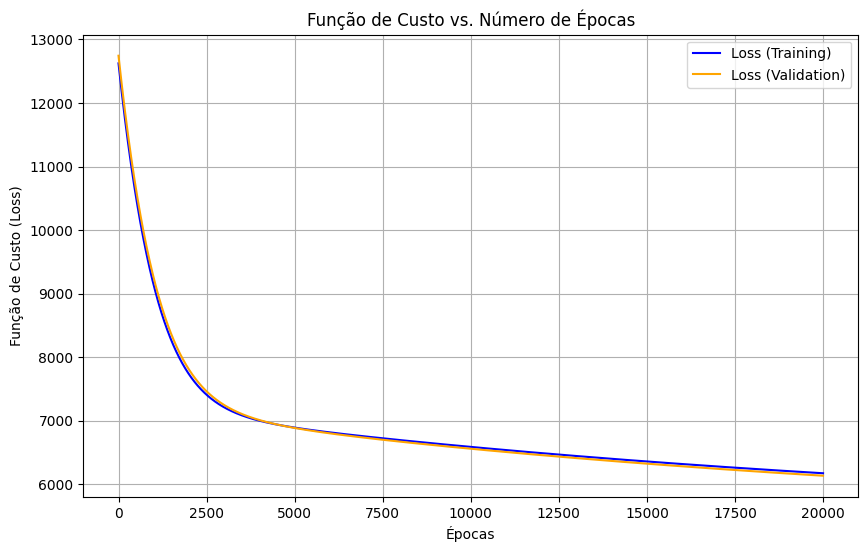

In [1099]:
gd = GradientDescentModel(learning_rate=0.0001, epochs=20000)
gd.fit(X_train.values, y_train.values, X_val.values, y_val.values)
gd.plot_loss()

> **Quais foram suas conclusões? (1-2 parágrafos)**




*Escreva as conclusões aqui.*

 4. (0,25 pontos) Compare o seu melhor experimento baseado em GD com a sua implementação da equação normal.

In [1100]:
gd = GradientDescentModel(learning_rate=0.1, epochs=20000)
gd.fit(X_train.values, y_train.values)

err_treino = gd.loss_function(y_train.values, lr.predict(X_train.values))
err_val = gd.loss_function(y_val.values, gd.predict(X_val.values))

print(f'Erro treino: {err_treino}')
print(f'Erro validação: {err_val}')

Erro treino: 4740.451540126865
Erro validação: 5053.74435178833


In [1101]:
lr = LinearRegressionModel()
lr.fit(X_train.values, y_train.values)

err_treino = lr.loss_function(y_train.values, lr.predict(X_train.values))
err_val = lr.loss_function(y_val.values, lr.predict(X_val.values))

print(f'Erro treino: {err_treino}')
print(f'Erro validação: {err_val}')

Erro treino: 4740.451540126865
Erro validação: 5054.749499405893


> **Quais foram suas conclusões? (1-2 parágrafos)**




In [1102]:
'''
  É notável que a equação Normal é bem mais rapida do que o metódo da descida do
  gradiente e para além disso esse metódo é bem mais simple de se aplicar, dado
  que não é necessário achar os hiperparâmetros mais adequados para o problema.
  Diante disso para problemas de regressão linear como o aprensentado seria
  prefirivel utilizar a equação normal.
'''

'\n  É notável que a equação Normal é bem mais rapida do que o metódo da descida do \n  gradiente e para além disso esse metódo é bem mais simple de se aplicar, dado \n  que não é necessário achar os hiperparâmetros mais adequados para o problema.\n  Diante disso para problemas de regressão linear como o aprensentado seria\n  prefirivel utilizar a equação normal.\n'

*Escreva as conclusões aqui.*

5. (1,25 pontos) Implementa e execute duas regressões lineares utilizando sklearn:

  1. Execute uma regressão com `sklearn.linear_model.SGDRegressor`, que utiliza descida do gradiente minimizando uma função de custo regularizada.
  2. Execute uma regressão com `sklearn.linear_model.LinearRegression`, que utiliza o método da equação normal.

  Compare os resultados obtidos com as suas implementações (de GD e da equação normal).

  Ou seja, compare o `sklearn.linear_model.SGDRegressor` com a sua implementação da descida do gradiente e o `sklearn.linear_model.LinearRegression` com a sua implementação da equação normal.

  > **Observação:** Utilize uma learning rate igual a algum dos experimentos que já fez para realizar uma comparação justa.


In [1103]:
from sklearn.linear_model import SGDRegressor, LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error


In [1104]:
def loss_function(y_true, y_pred):
  mse = mean_squared_error(y_true, y_pred)
  return np.sqrt(mse)

In [1105]:
sgd_reg = SGDRegressor(max_iter=20000, penalty='l2', alpha=0.1)
sgd_reg.fit(X_train, y_train)
y_pred = sgd_reg.predict(X_val)
loss_function(y_val.values, y_pred)

5488.8864572419525

In [1106]:
ln_reg = LinearRegression()
ln_reg.fit(X_train, y_train)
y_pred = ln_reg.predict(X_val)
loss_function(y_val.values, y_pred)

5054.799962276899

> **Quais foram suas conclusões? (1-2 parágrafos)**




In [1107]:
'''
  É interessante notar como os resultados de ambas as implementações do sklearn
  se aproximam do resultado apresentados pelas implementações naive presentes neste
  notebook, indicando que as implementações estão corretas.
'''

'\n  É interessante notar como os resultados de ambas as implementações do sklearn\n  se aproximam do resultado apresentados pelas implementações naive presentes neste\n  notebook, indicando que as implementações estão corretas.\n'

*Escreva as conclusões aqui.*

6. (0,4 ponto) Às vezes, precisamos de alguma função mais complexa para fazer uma boa predição. Elabore e avalie um modelo de Regressão Polinomial.

In [1108]:
degree = 2
poly = PolynomialFeatures(degree=degree)
X_train_poly = poly.fit_transform(X_train)
x_val_poly = poly.transform(X_val)
lin_reg = LinearRegression()
lin_reg.fit(X_train_poly, y_train)

y_train_pred = lin_reg.predict(X_train_poly)
y_val_pred = lin_reg.predict(x_val_poly)

print(f'Erro no treino : {loss_function(y_train, y_train_pred)}')
print(f'Erro na validação: {loss_function(y_val, y_val_pred)}')


Erro no treino : 712.617874003203
Erro na validação: 51593979626267.695


> **Quais foram suas conclusões? (1-2 parágrafos)**




In [1109]:
'''
  O erro na validação da regressão polinomial é absurda, enquanto que seu erro na validação
  muito inferior a isso, indicando claramente uma overfit. Diante disso, não recomendavel
  utilizar esse tipo de regressão para o problema proposto.
'''

'\n  O erro na validação da regressão polinomial é absurda, enquanto que seu erro na validação\n  muito inferior a isso, indicando claramente uma overfit. Diante disso, não recomendavel\n  utilizar esse tipo de regressão para o problema proposto.\n'

*Escreva as conclusões aqui.*

## Regressão Logística

Esta parte do trabalho visa prever a faixa salarial dos profissionais, descrita pelo atributo `faixa_salarial`, com base em seus dados demográficos e informações de carreira. Portanto, não utilize os atributos `salario` e `faixa_salarial` como *features* dos seus modelos, apenas para o cálculo da função de custo durante o treinamento e a validação.

### Atividades

1. (0,1 pontos) Faça a seleção das features mais importantes para o treinamento da sua regressão logística, com base em sua análise exploratória.

In [1110]:
'''
  A selação de feature foi feita anteriormente, então o conjunto X_train_class
  já contém as features que achamos interessantes para o problema.
'''
X_train_class.head(3)


,idade,nivel_ensino,gestor,nivel_profissional,tempo_exp_dados,tempo_exp_ti,genero_Feminino,genero_Masculino,genero_Outro,genero_Prefiro não informar,cor_raca_Amarela,cor_raca_Branca,cor_raca_Indígena,cor_raca_Outra,cor_raca_Parda,cor_raca_Prefiro não informar,cor_raca_Preta,pcd_Não,pcd_Prefiro não informar,pcd_Sim,area_formacao_Ciências Biológicas/ Farmácia/ Medicina/ Área da Saúde,area_formacao_Ciências Sociais,area_formacao_Computação / Engenharia de Software / Sistemas de Informação/ TI,area_formacao_Economia/ Administração / Contabilidade / Finanças/ Negócios,area_formacao_Estatística/ Matemática / Matemática Computacional/ Ciências Atuariais,area_formacao_Marketing / Publicidade / Comunicação / Jornalismo,area_formacao_Outra opção,area_formacao_Outras Engenharias,area_formacao_Química / Física,situacao_trabalho_Empreendedor ou Empregado (CNPJ),situacao_trabalho_Empregado (CLT),situacao_trabalho_Estagiário,situacao_trabalho_Freelancer,situacao_trabalho_Prefiro não informar,situacao_trabalho_Servidor Público,situacao_trabalho_Vivo fora do Brasil e trabalho para empresa de fora do Brasil,situacao_trabalho_Vivo no Brasil e trabalho remoto para empresa de fora do Brasil,setor_Agronegócios,setor_Educação,setor_Entretenimento ou Esportes,setor_Filantropia/ONG's,setor_Finanças ou Bancos,setor_Indústria,setor_Internet/Ecommerce,setor_Marketing,setor_Outra Opção,setor_Seguros ou Previdência,setor_Setor Alimentício,setor_Setor Automotivo,setor_Setor Farmaceutico,setor_Setor Imobiliário/ Construção Civil,setor_Setor Público,setor_Setor de Energia,setor_Tecnologia/Fábrica de Software,setor_Telecomunicação,setor_Varejo,setor_Área da Saúde,setor_Área de Consultoria,cargo_Analista de BI/BI Analyst,cargo_Analista de Dados/Data Analyst,cargo_Analista de Inteligência de Mercado/Market Intelligence,cargo_Analista de Negócios/Business Analyst,cargo_Analista de Suporte/Analista Técnico,cargo_Analytics Engineer,cargo_Cientista de Dados/Data Scientist,cargo_DBA/Administrador de Banco de Dados,cargo_Data Product Manager/ Product Manager (PM/APM/DPM/GPM/PO),cargo_Desenvolvedor/ Engenheiro de Software/ Analista de Sistemas,cargo_Diretor/VP,cargo_Economista,cargo_Engenheiro de Dados/Arquiteto de Dados/Data Engineer/Data Architect,cargo_Engenheiro de Machine Learning/ML Engineer/AI Engineer,cargo_Estatístico,cargo_Gerente/Head,cargo_Outra Opção,cargo_Outras Engenharias (não inclui dev),cargo_Professor/Pesquisador,cargo_Supervisor/Coordenador,"cargo_Sócio ou C-level (CEO, CDO, CIO, CTO etc)",cargo_Team Leader/Tech Leader,linguagens_trabalho_.NET,linguagens_trabalho_C/C++/C#,linguagens_trabalho_Java,linguagens_trabalho_JavaScript,linguagens_trabalho_Julia,linguagens_trabalho_Matlab,linguagens_trabalho_Não utilizo nenhuma das linguagens listadas,linguagens_trabalho_PHP,linguagens_trabalho_Python,linguagens_trabalho_R,linguagens_trabalho_Rust,linguagens_trabalho_SAS/Stata,linguagens_trabalho_SQL,linguagens_trabalho_Scala,linguagens_trabalho_Visual Basic/VBA,ferramenta_bi_dia_a_dia_Alteryx,ferramenta_bi_dia_a_dia_Amazon Quicksight,ferramenta_bi_dia_a_dia_Birst,ferramenta_bi_dia_a_dia_Fazemos todas as análises utilizando apenas Excel ou planilhas do google,ferramenta_bi_dia_a_dia_Grafana,ferramenta_bi_dia_a_dia_IBM Analytics/Cognos,ferramenta_bi_dia_a_dia_Looker,ferramenta_bi_dia_a_dia_Looker Studio (antigo Google Data Studio),ferramenta_bi_dia_a_dia_Metabase,ferramenta_bi_dia_a_dia_MicroStrategy,ferramenta_bi_dia_a_dia_Microsoft PowerBI,ferramenta_bi_dia_a_dia_Mode,ferramenta_bi_dia_a_dia_Não utilizo nenhuma ferramenta de BI no trabalho,ferramenta_bi_dia_a_dia_Oracle Business Intelligence,ferramenta_bi_dia_a_dia_Outra opção,ferramenta_bi_dia_a_dia_Pentaho,ferramenta_bi_dia_a_dia_Qlik View/Qlik Sense,ferramenta_bi_dia_a_dia_Redash,ferramenta_bi_dia_a_dia_SAP Business Objects/SAP Analytics,ferramenta_bi_dia_a_dia_SAS Visual Analytics,ferramenta_bi_dia_a_dia_Salesforce/Einstein Analytics,ferramenta_bi_dia_a_dia_Superset,ferramenta_bi_dia_a_dia_TIBCO Spotfire

2. (1,0 pontos) Faça uma Regressão Logística Multinomial. Ela é uma generalização da Regressão Logística para o caso em que queremos lidar com várias classes.

    Use a classe `sklearn.linear_model.SGDClassifier`, passando o parâmetro `loss="log_loss"` no construtor, para criar uma Regressão Logística a ser otimizada por descida do gradiente.

    Experimente diferentes valores de learning rate e avalie o impacto desse hiperparâmetro no treinamento do modelo.

In [1111]:
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report, log_loss
from sklearn.inspection import DecisionBoundaryDisplay

In [1346]:
def test_different_learning_rate(lerning_rates):
  for learning_rate in lerning_rates:
    sgd_clf= SGDClassifier(loss="log_loss", alpha=learning_rate,)
    sgd_clf.fit(X_train_class, y_train_class)
    y_pred = sgd_clf.predict(X_val_class)
    accuracy = accuracy_score(y_val_class, y_pred)
    print("Accuracy:", accuracy)

test_different_learning_rate([0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10])

Accuracy: 0.2805049088359046
Accuracy: 0.3506311360448808
Accuracy: 0.3380084151472651
Accuracy: 0.33520336605890605
Accuracy: 0.24123422159887797
Accuracy: 0.2061711079943899
Accuracy: 0.2061711079943899


> **Quais foram suas conclusões? (1-2 parágrafos)**




In [1113]:
'''
  Interessante notar que a usar differentes de learning rate variando a escala entre
  eles é notável um movimento quase parabólico, no sentido que um learning rate muito
  baixo é ruim tal como um learning rate mais alto, de modo que o mais adequado fica
  em uma região no meio deste valores.

  Infelizmente o modelo está apresentando um acuracia abaixo dos 50%, indicando que
  o modelos não está conseguindo classificar bem.
'''

'\n  Interessante notar que a usar differentes de learning rate variando a escala entre\n  eles é notável um movimento quase parabólico, no sentido que um learning rate muito\n  baixo é ruim tal como um learning rate mais alto, de modo que o mais adequado fica\n  em uma região no meio deste valores.\n'

*Escreva as conclusões aqui.*

3. (0,75 ponto) Faça um gráfico da função de custo vs. número de épocas, em relação ao conjunto de treinamento e ao conjunto de validação. Também faça um gráfico, de mesma estrutura, descrevendo a acurácia vs. número de época.

    Como é o comportamento do modelo? O modelo está aprendendo?

In [1526]:
class SGDTrainer:
    def __init__(self, alpha=0.0008, learning_rate='constant', eta0=0.01):
        self.alpha = alpha
        self.eta0 = eta0
        self.model = None


    def initialize_model(self):
        self.model = SGDClassifier(loss="log_loss", alpha=self.alpha, eta0=self.eta0)

    def train(self, X_train, y_train, X_val, y_val, max_epochs=100):
        self.initialize_model()

        train_losses, val_losses = [], []
        train_accuracies, val_accuracies = [], []

        for epoch in range(1, max_epochs + 1):
            self.model.partial_fit(X_train, y_train, classes=np.unique(y_train))

            y_train_pred = self.model.predict(X_train)
            train_loss = log_loss(y_train, self.model.predict_proba(X_train))
            train_acc = accuracy_score(y_train, y_train_pred)

            y_val_pred = self.model.predict(X_val)
            val_loss = log_loss(y_val, self.model.predict_proba(X_val))
            val_acc = accuracy_score(y_val, y_val_pred)

            train_losses.append(train_loss)
            val_losses.append(val_loss)
            train_accuracies.append(train_acc)
            val_accuracies.append(val_acc)

        return train_losses, val_losses, train_accuracies, val_accuracies

    def plot_metrics(train_metrics, val_metrics, metric_name='Loss', ylabel='Loss', xlabel='Epochs'):
        plt.figure(figsize=(10, 6))
        plt.plot(train_metrics, label=f'Training {metric_name}', color='blue')
        plt.plot(val_metrics, label=f'Validation {metric_name}', color='orange')
        plt.title(f'Training and Validation {metric_name} over Epochs')
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_confusion_matrix(self, X_val, y_val, labels):
      y_val_pred = self.model.predict(X_val)
      cm = confusion_matrix(y_val, y_val_pred)
      plt.figure(figsize=(8, 6))
      sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)
      plt.title('Confusion Matrix')
      plt.xlabel('Predicted Labels')
      plt.ylabel('True Labels')
      plt.show()

    def plot_decision_boundary(self, X, y):
        # Plot decision boundary
      plt.figure(figsize=(20, 20))
      DecisionBoundaryDisplay.from_estimator(self.model, X, response_method="predict", cmap=plt.cm.Paired)

      colors = colors = sns.color_palette("husl", len(np.unique(y)))
      for i, color in zip(self.model.classes_, colors):
        idx = np.where(y.values == i)[0]
        plt.scatter(X.iloc[idx, 0], X.iloc[idx, 1], c=color, edgecolor="black", s=20, label=f'Class {i}')

      plt.legend()  # Add legend to differentiate between classes
      plt.title("Decision Boundary with Data Points")
      plt.show()

      def print_classification_report(self, X_val, y_val, zero_division=1):
        y_pred = self.model.predict(X_val)
        report = classification_report(y_val, y_pred, zero_division=zero_division)
        print("Relatório de Classificação:\n", report)

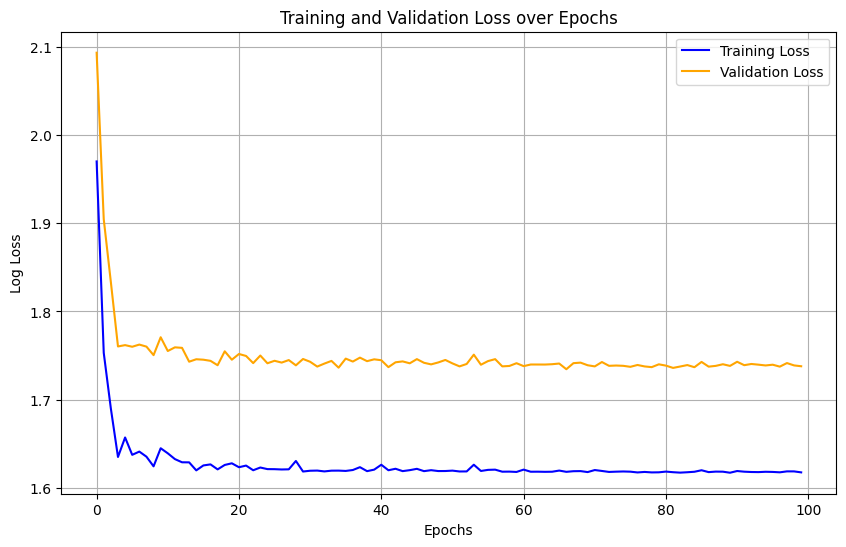

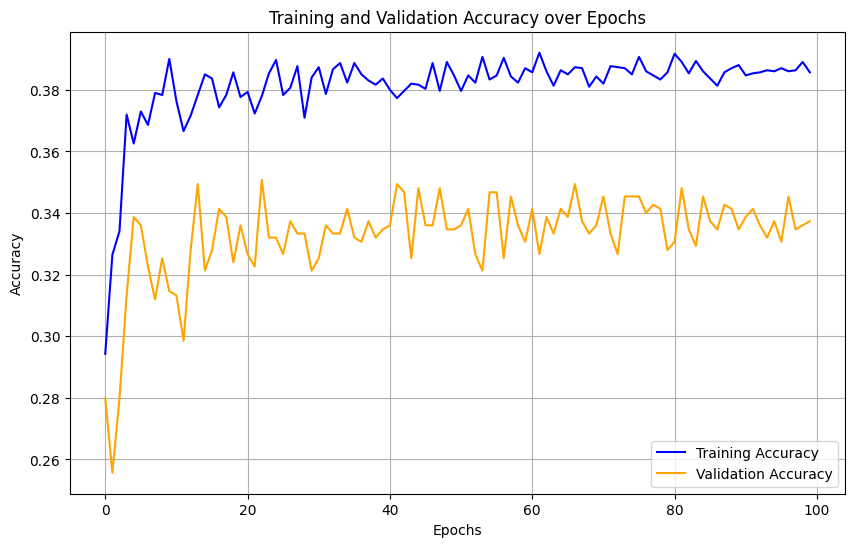

In [1510]:
trainer = SGDTrainer(alpha=0.001)
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train(X_train_class, y_train_class, X_val_class, y_val_class, max_epochs=100)
SGDTrainer.plot_metrics(train_losses, val_losses, metric_name='Loss', ylabel='Log Loss')
SGDTrainer.plot_metrics(train_accuracies, val_accuracies, metric_name='Accuracy', ylabel='Accuracy')

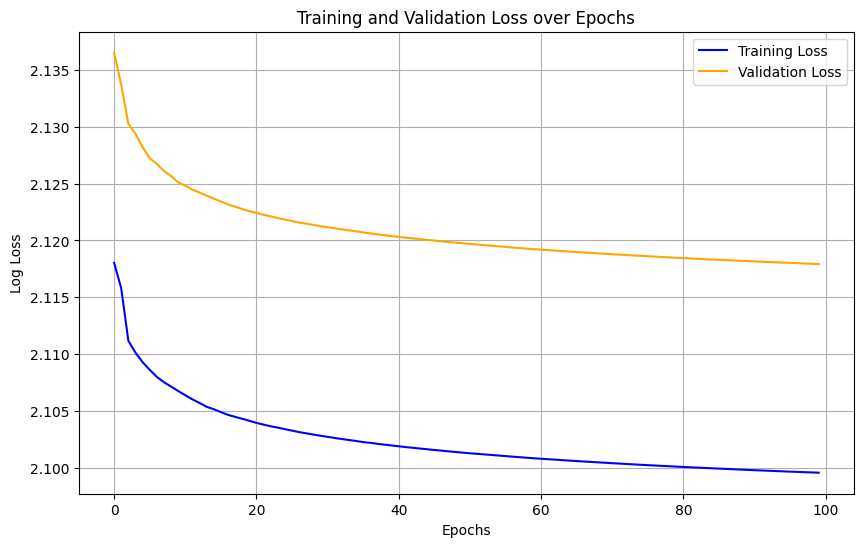

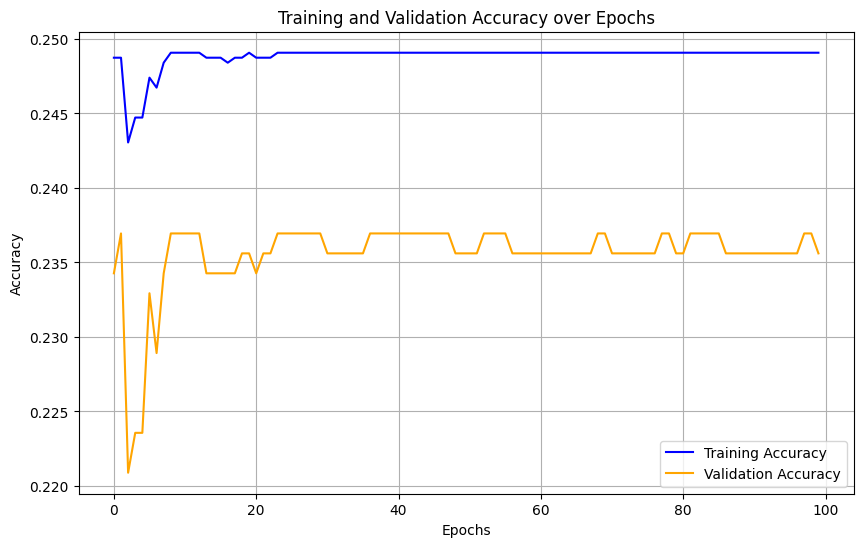

In [1423]:
trainer = SGDTrainer(alpha=0.1, learning_rate='constant')
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train(X_train_class, y_train_class, X_val_class, y_val_class, max_epochs=100)
SGDTrainer.plot_metrics(train_losses, val_losses, metric_name='Loss', ylabel='Log Loss')
SGDTrainer.plot_metrics(train_accuracies, val_accuracies, metric_name='Accuracy', ylabel='Accuracy')

> **Quais foram suas conclusões? (1-2 parágrafos)**




*Escreva as conclusões aqui.*

In [1428]:
'''Diante desses gráficos, podemos confirmar a baixa acurácia do modelo, que não
  consegue ultrapassar 40%. No entanto, o modelo não apresenta sinais de overfitting,
  o que pode indicar um problema no conjunto de dados, como possível desbalanceamento
  ou falta de variáveis explicativas relevantes para a tarefa de classificação.
'''

'Diante desses gráficos, podemos confirmar a baixa acurácia do modelo, que não\n  consegue ultrapassar 40%. No entanto, o modelo não apresenta sinais de overfitting, \n  o que pode indicar um problema no conjunto de dados, como possível desbalanceamento\n  ou falta de variáveis explicativas relevantes para a tarefa de classificação. \n'

4. (0,9 pontos) Faça pelo menos 2 gráficos que visualizem as fronteiras de decisão entre duas *features*. Por exemplo, você pode fazer um gráfico da fronteira de decisão entre os atributos `tempo_exp_dados` e `satisfacao_empresa`, caso tenha utilizado essas *features*. Verifique se está fazendo o plot para atributos relevantes utilizados em seu modelo.

    > **Observação:** [Este tutorial](https://scikit-learn.org/stable/auto_examples/linear_model/plot_sgd_iris.html#sphx-glr-auto-examples-linear-model-plot-sgd-iris-py) do scikit-learn demonstra como extrair essas informações do `sklearn.linear_model.SGDClassifier`.

<ipython-input-1526-d6c6ed67bf37>:64: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X.iloc[idx, 0], X.iloc[idx, 1], c=color, edgecolor="black", s=20, label=f'Class {i}')


<Figure size 2000x2000 with 0 Axes>

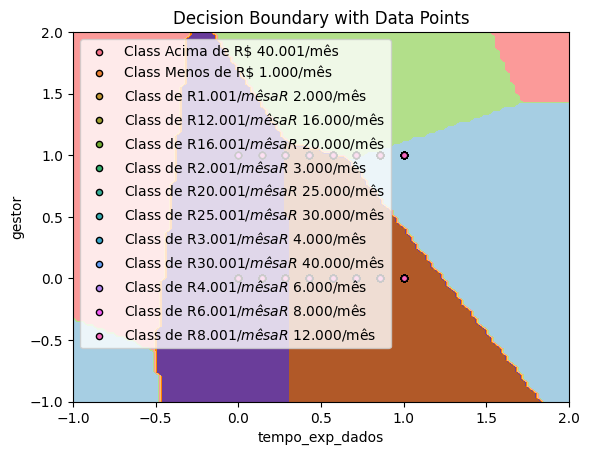

In [1527]:
trainer = SGDTrainer(alpha=0.001)
X_aux = X_train_class[['tempo_exp_dados', 'gestor']]
X_val_aux = X_val_class[['tempo_exp_dados', 'gestor']]
trainer.train(X_aux, y_train_class, X_val_aux, y_val_class, max_epochs=100)
trainer.plot_decision_boundary(X_val_aux, y_val_class)

<ipython-input-1526-d6c6ed67bf37>:64: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X.iloc[idx, 0], X.iloc[idx, 1], c=color, edgecolor="black", s=20, label=f'Class {i}')


<Figure size 2000x2000 with 0 Axes>

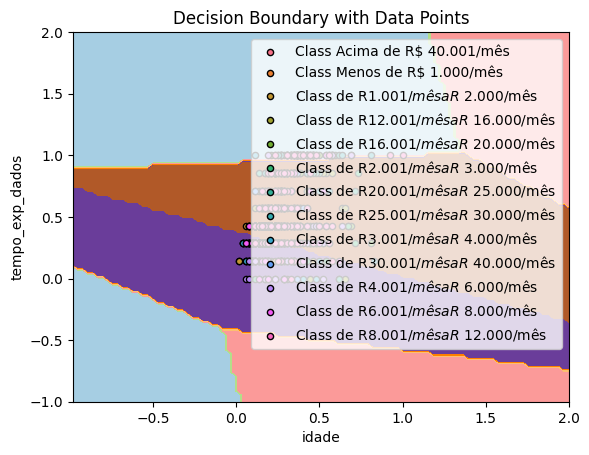

In [1528]:
trainer = SGDTrainer(alpha=0.001)
X_aux = X_train_class[['idade', 'tempo_exp_dados']]
X_val_aux = X_val_class[['idade', 'tempo_exp_dados']]
trainer.train(X_aux, y_train_class, X_val_aux, y_val_class, max_epochs=100)
trainer.plot_decision_boundary(X_val_aux, y_val_class)

> **Quais foram suas conclusões? (1-2 parágrafos)**




In [ ]:
'''
  Atraveés dessas figuras percebemos que o nosso modelos assumi que muitos pontos
  fazem parte de um conjunto limitado de classes, mostrando que o modelo não consegue
  classificar distinguir entre as diferentes classes do dataset.
'''

*Escreva as conclusões aqui.*

5. (0,75 pontos) Avalie os resultados do seu modelo, utilizando métricas de classificação que achar relevante. Plote a matriz de confusão e analise os resultados.

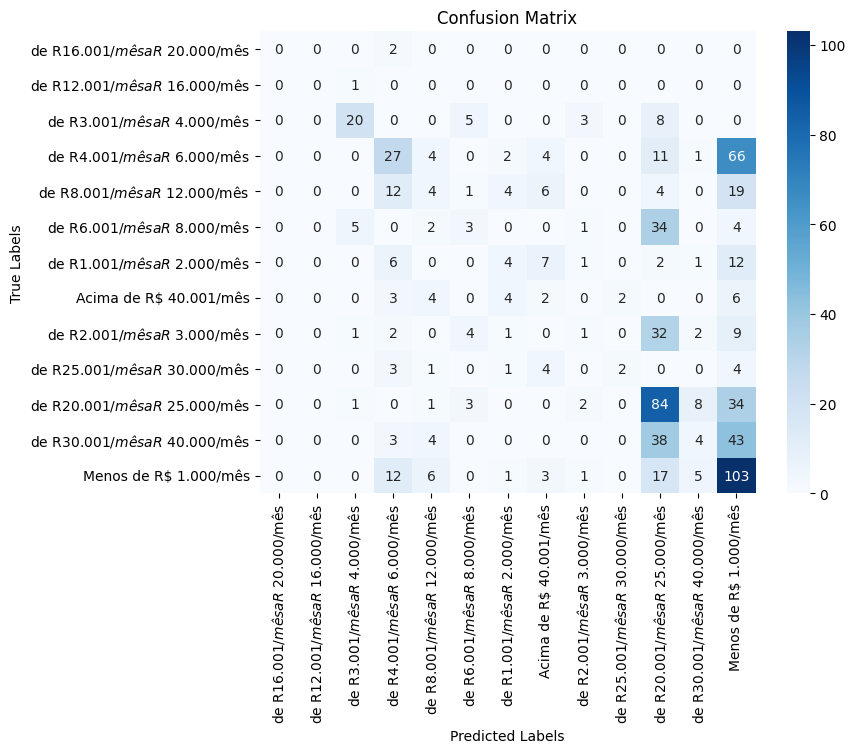

In [1456]:
trainer = SGDTrainer(alpha=0.001)
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train(X_train_class, y_train_class, X_val_class, y_val_class, max_epochs=100)

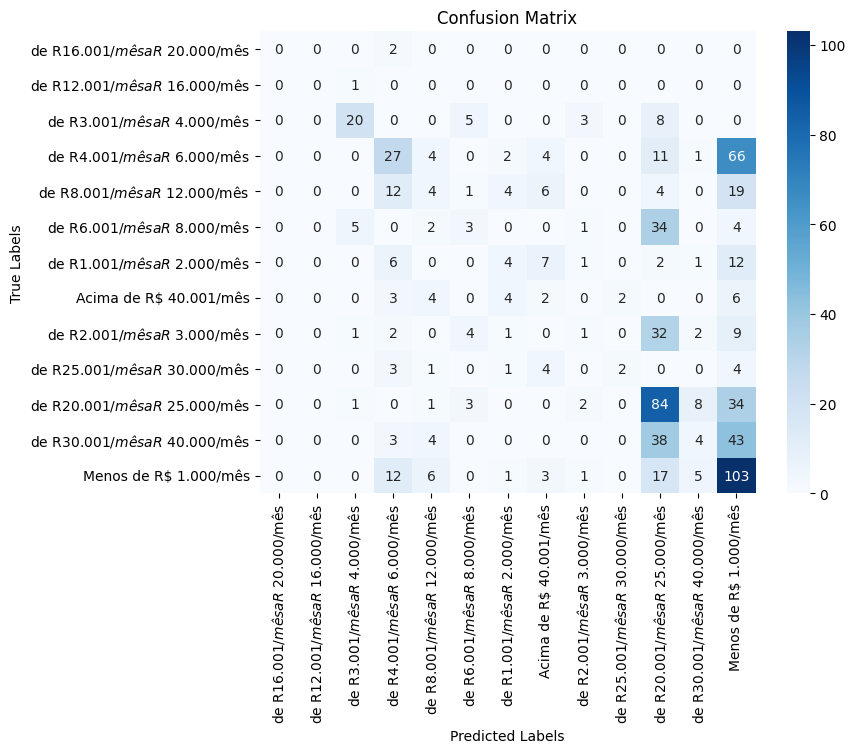

In [1457]:
trainer.plot_confusion_matrix(X_val_class, y_val_class, y_val_class.unique())


In [1426]:
trainer.print_classification_report(X_val_class, y_val_class)

Relatório de Classificação:
                                   precision    recall  f1-score   support

          Acima de R$ 40.001/mês       1.00      0.00      0.00         2
           Menos de R$ 1.000/mês       1.00      0.00      0.00         1
  de R$ 1.001/mês a R$ 2.000/mês       0.71      0.56      0.62        36
de R$ 12.001/mês a R$ 16.000/mês       0.39      0.26      0.31       115
de R$ 16.001/mês a R$ 20.000/mês       0.16      0.10      0.12        50
  de R$ 2.001/mês a R$ 3.000/mês       0.20      0.06      0.09        49
de R$ 20.001/mês a R$ 25.000/mês       0.25      0.12      0.16        33
de R$ 25.001/mês a R$ 30.000/mês       0.08      0.10      0.09        21
  de R$ 3.001/mês a R$ 4.000/mês       0.14      0.02      0.03        52
de R$ 30.001/mês a R$ 40.000/mês       0.33      0.07      0.11        15
  de R$ 4.001/mês a R$ 6.000/mês       0.37      0.67      0.47       133
  de R$ 6.001/mês a R$ 8.000/mês       0.21      0.07      0.10        92
 de R$ 8

> **Quais foram suas conclusões? (1-2 parágrafos)**


*Escreva as conclusões aqui.*

In [1458]:
'''
  O relatório de classificação mostra que o modelo tem uma performance geral bastante baixa,
  com uma precisão total de 34%. Isso significa que o modelo está acertando apenas cerca de
  um terço das previsões, o que é insatisfatório para uma tarefa de classificação. Além disso,
  as métricas de precisão, recall e F1 variam bastante entre as diferentes faixas de renda. Em
  classes com poucos exemplos, como "Acima de R$ 40.001/mês" e "Menos de R$ 1.000/mês", o modelo
  praticamente não conseguiu prever corretamente, resultando em recalls de 0, o que indica que
  ele não está conseguindo identificar corretamente as instâncias dessas classes. Já em faixas
  mais comuns, como "de R$ 4.001/mês a R$ 6.000/mês" e "de R$ 8.001/mês a R$ 12.000/mês", o
  desempenho é um pouco melhor, com F1-scores acima de 0,45, mostrando que o modelo consegue,
  em certa medida, diferenciar essas classes mais frequentes.

  Entretanto, o desequilíbrio entre as classes parece ser um dos principais problemas, uma vez que
  algumas faixas têm muito poucos exemplos, prejudicando o aprendizado do modelo para essas categorias. 7
  A baixa precisão e recall na maioria das classes sugere que o modelo não está conseguindo capturar bem
  os padrões nos dados, o que pode indicar uma necessidade de ajustes ou de mais dados.
'''

'\n  O relatório de classificação mostra que o modelo tem uma performance geral bastante baixa, \n  com uma precisão total de 34%. Isso significa que o modelo está acertando apenas cerca de\n  um terço das previsões, o que é insatisfatório para uma tarefa de classificação. Além disso,\n  as métricas de precisão, recall e F1 variam bastante entre as diferentes faixas de renda. Em \n  classes com poucos exemplos, como "Acima de R$ 40.001/mês" e "Menos de R$ 1.000/mês", o modelo\n  praticamente não conseguiu prever corretamente, resultando em recalls de 0, o que indica que \n  ele não está conseguindo identificar corretamente as instâncias dessas classes. Já em faixas \n  mais comuns, como "de R$ 4.001/mês a R$ 6.000/mês" e "de R$ 8.001/mês a R$ 12.000/mês", o \n  desempenho é um pouco melhor, com F1-scores acima de 0,45, mostrando que o modelo consegue, \n  em certa medida, diferenciar essas classes mais frequentes.\n\n  Entretanto, o desequilíbrio entre as classes parece ser um dos prin

## Submissão dos resultados no Kaggle

Para avaliar o desempenho do seu modelo, você deve submeter suas predições, no conjunto de teste, na competição [Tarefa #2 de MC886/MO444 2024S2](https://www.kaggle.com/t/20fa042c08f5453abd89d946468bd3de) do Kaggle.

A plataforma calculará automaticamente a métrica de avaliação e fornecerá um score.

> **Observação:** Não se preocupe apenas com o resultado do seu modelo. O seu score no placar não irá influenciar a sua nota nesta atividade :).

### Atividades

1. (1,0 pontos) Escolha **seus melhores modelos** para as duas tarefas feitas (regressão e classificação) e faça a predição dos atributos `salario` e `faixa_salarial` com base nos dados da pesquisa contidos no **conjunto de teste**.

  **Gere um arquivo de submissão, de tipo CSV, no formato adequado:** Gere uma linha por pessoa no conjunto de teste, com as duas colunas para os valores preditos, que devem estar nomeadas como **`salario`** e **`faixa_salarial`**.

  > Exemplo de arquivo (com o cabeçalho e conteúdo formatados):
  > ```
  > id, salario, faixa_salarial
  > 1, 0.0, "de R$ 0/mês a R$ 0/mês"
  > 2, 0.0, "de R$ 0/mês a R$ 0/mês"
  > 3, 0.0, "de R$ 0/mês a R$ 0/mês"
  > ```

  Submeta suas predições na competição [Tarefa #2 de MC886/MO444 2024S2](https://www.kaggle.com/t/20fa042c08f5453abd89d946468bd3de) no Kaggle.

  Conte para a gente! Qual foi o resultado que você obteve na competição? :)

In [1361]:
test = pd.read_csv('test_data.csv')

ids = test['id']
test.index

RangeIndex(start=0, stop=951, step=1)

In [1362]:
test = adjust_dataset_drop_unecessary_features(test)
test = adjust_dataset_fill_empty_data(test)
test = adjust_dataset_one_hot_encoding(test)
test = adjust_dataset_encode_order(test)
test = adjust_dataset_encode_multilabel(test)
test = adjust_dataset_normalize(test)

test.head(3)

,idade,nivel_ensino,gestor,nivel_profissional,tempo_exp_dados,tempo_exp_ti,area_formacao_Ciências Biológicas/ Farmácia/ Medicina/ Área da Saúde,area_formacao_Ciências Sociais,area_formacao_Computação / Engenharia de Software / Sistemas de Informação/ TI,area_formacao_Economia/ Administração / Contabilidade / Finanças/ Negócios,area_formacao_Estatística/ Matemática / Matemática Computacional/ Ciências Atuariais,area_formacao_Marketing / Publicidade / Comunicação / Jornalismo,area_formacao_Outra opção,area_formacao_Outras Engenharias,area_formacao_Química / Física,situacao_trabalho_Empreendedor ou Empregado (CNPJ),situacao_trabalho_Empregado (CLT),situacao_trabalho_Estagiário,situacao_trabalho_Freelancer,situacao_trabalho_Prefiro não informar,situacao_trabalho_Servidor Público,situacao_trabalho_Vivo fora do Brasil e trabalho para empresa de fora do Brasil,situacao_trabalho_Vivo no Brasil e trabalho remoto para empresa de fora do Brasil,setor_Agronegócios,setor_Educação,setor_Entretenimento ou Esportes,setor_Filantropia/ONG's,setor_Finanças ou Bancos,setor_Indústria,setor_Internet/Ecommerce,setor_Marketing,setor_Outra Opção,setor_Seguros ou Previdência,setor_Setor Alimentício,setor_Setor Automotivo,setor_Setor Farmaceutico,setor_Setor Imobiliário/ Construção Civil,setor_Setor Público,setor_Setor de Energia,setor_Tecnologia/Fábrica de Software,setor_Telecomunicação,setor_Varejo,setor_Área da Saúde,setor_Área de Consultoria,cargo_Analista de BI/BI Analyst,cargo_Analista de Dados/Data Analyst,cargo_Analista de Inteligência de Mercado/Market Intelligence,cargo_Analista de Negócios/Business Analyst,cargo_Analista de Suporte/Analista Técnico,cargo_Analytics Engineer,cargo_Cientista de Dados/Data Scientist,cargo_DBA/Administrador de Banco de Dados,cargo_Data Product Manager/ Product Manager (PM/APM/DPM/GPM/PO),cargo_Desenvolvedor/ Engenheiro de Software/ Analista de Sistemas,cargo_Diretor/VP,cargo_Economista,cargo_Engenheiro de Dados/Arquiteto de Dados/Data Engineer/Data Architect,cargo_Engenheiro de Machine Learning/ML Engineer/AI Engineer,cargo_Estatístico,cargo_Gerente/Head,cargo_Outra Opção,cargo_Outras Engenharias (não inclui dev),cargo_Professor/Pesquisador,cargo_Supervisor/Coordenador,"cargo_Sócio ou C-level (CEO, CDO, CIO, CTO etc)",cargo_Team Leader/Tech Leader
0,0.318182,0.714286,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.113636,0.000000,0.0,0.0,0.285714,0.166667,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.659091,0.714286,1.0,0.5,0.857143,0.166667,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1379]:
sg =  SGDClassifier(loss="log_loss", alpha= 0.0001)
sg.fit(X_train_class, y_train_class)
y_pred_class = sg.predict(test)

In [1356]:
gd = GradientDescentModel(learning_rate=0.1, epochs=20000)
gd.fit(X_train.values, y_train.values)
y_pred_gd= gd.predict(test.values)

In [1377]:
submission = pd.DataFrame({'id': ids, 'faixa_salarial': y_pred_class})
submission.to_csv('logistica.csv', index=False)

In [1384]:
submission = pd.DataFrame({'id': ids, 'salario': y_pred_gd})
submission.to_csv('linear.csv', index=False)

*Conte aqui :)*

## Prazo

09 de outubro, quarta-feira, 23:59.

Política de penalidade para submissões atrasadas: Você não está sendo encorajada(o) a submeter o trabalho depois da data de submissão. Entretanto, caso isso aconteça, a nota será penalizada da seguinte forma:
- 10 de outubro, 23:59: nota * 0,75
- 11 de outubro, 23:59: nota * 0,5
- 12 de outubro, 23:59: nota * 0,25


## Envio

No Google Classroom, envie seu Jupyter Notebook, no formato RA1_RA2_2024s2_mc886mo444_tarefa_02.ipynb.

**Esta atividade NÃO é individual, deve ser realizada em dupla (grupo de duas pessoas).**
